# World Happiness Report (2015-2022)

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 1. Description and purpose of the project

### We are going to check how the level of people's happiness depends on the features in our data collection and how much it changes over time. We will analyze happiness level from 2015-2022. 

The results of the happiness level in reports are the sum of seven factors. The higher the value of each of them, the higher the level of happiness. We can define the significance of these factors as the degree which these factors lead to happiness. The goal of this project is to determine, which factors are more important for a happier life. As a result, people and countries can focus on more important factors, to achieve a higher level of happiness. We will implement several machine learning models to predict the outcome of happiness and compare which algorithm works best for that particular dataset. 

### What is the World Happiness Report? 

The World Happiness Report is a groundbreaking study of the state of global happiness. The report continues to gain global recognition as governments, organisations and civil society increasingly use happiness indicators to make political decisions. Leading experts in leading fields - economics, psychology, survey analysis, national statistics, health, public policy and more - describe how satisfaction measures can be effectively used to assess changeS in society. The reports present the state of happiness in the modern world and show how the new science about happiness explains personal and national differences in happiness. 


The results are from nationally representative samples and use Gallup weights to make estimates representative. The columns following the happiness score estimate how each of the six factors – economic output, social support, life expectancy, freedom, non-corruption, and generosity – contributes to a higher value of life in each country than for Dystopia, a hypothetical country that has values equal to the lowest national average in the world for each of the six factors. They do not affect the overall score reported for each country, but explain why some countries are ranked higher than others. 


The goal of having Dystopia is to have a reference where countries can be compared favorably (no country performs worse than Dystopia). The lowest results observed for the six key variables are therefore characteristic of Dystopia.

### Our dataset contains the following data:

- Year - Rok
- Country - Kraj
- Happiness - Szczęśliwość, zadowolenie
- GDP per capita - wpływ PKB na zadowolenie
- Socjal support - Pomoc socjalna
- Life Exp - Spodziewana długość zdrowego życia
- Freedom - Wolność osobista
- Generosity - Hojność społeczeństwa
- Gov Corruption - Postrzeganie korupcji
- Dystopia Residual - Porównanie do "Dystopii", hipotetycznym kraju o najgorszych wszystkich wskaźnikach
- Broadband - Dostęp do szerokopasmowego internetu
- Internet individuals - % populacji indywidualnie używającej internet
- Fertility - Dzietność, średnia liczba dzieci urodzonych przez kobietę 
- Annual sunshine - Usłonecznienie

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 2.  Library imports

In [360]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly
from plotly.offline import iplot, init_notebook_mode 
init_notebook_mode() 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from scipy import stats
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor as rfr
from sklearn.metrics import r2_score

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)


## 3. Data Preparation and Mining (EDA)

**Loading data about people’s satisfaction in the years 2015 - 2022, removing unnecessary columns, renaming some of them. **

In [361]:
whr15 = pd.read_csv("2015.csv")
whr15.drop(['Standard Error', 'Happiness Rank', 'Region'], axis=1, inplace=True)
whr15.rename({'Happiness Score': 'Happiness', 'Economy (GDP per Capita)': 'GDP per capita', 
              'Health (Life Expectancy)': 'Life Exp', 
              'Trust (Government Corruption)': 'Gov Corruption',
             'Family': 'Social support'}, axis=1, inplace=True)

whr15['Year'] = 2015

whr15 = whr15.loc[:, ["Year","Country","Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [362]:
whr15.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176


In [363]:
whr16 = pd.read_csv("2016.csv")
whr16.drop(['Lower Confidence Interval', 'Happiness Rank', 'Region', 'Upper Confidence Interval'], axis=1, inplace=True)

whr16.rename({'Happiness Score': 'Happiness', 
              'Economy (GDP per Capita)': 'GDP per capita', 'Health (Life Expectancy)': 'Life Exp',
             'Trust (Government Corruption)': 'Gov Corruption',
             'Family': 'Social support'}, axis=1, inplace=True)

whr16['Year'] = 2016

whr16 = whr16.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [364]:
whr16.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2016,Denmark,7.526,1.44178,1.16374,0.79504,0.57941,0.36171,0.44453,2.73939
1,2016,Switzerland,7.509,1.52733,1.14524,0.86303,0.58557,0.28083,0.41203,2.69463
2,2016,Iceland,7.501,1.42666,1.18326,0.86733,0.56624,0.47678,0.14975,2.83137
3,2016,Norway,7.498,1.57744,1.12690,0.79579,0.59609,0.37895,0.35776,2.66465
4,2016,Finland,7.413,1.40598,1.13464,0.81091,0.57104,0.25492,0.41004,2.82596


In [365]:
whr17 = pd.read_csv("2017.csv")
whr17.drop(['Whisker.high', 'Happiness.Rank', 'Whisker.low'], axis=1, inplace=True)
whr17.rename({'Happiness.Score': 'Happiness', 
              'Economy..GDP.per.Capita.': 'GDP per capita',
              'Health..Life.Expectancy.': 'Life Exp', 'Trust..Government.Corruption.': 'Gov Corruption',
              'Dystopia.Residual': 'Dystopia Residual',
             'Family': 'Social support'}, axis=1, inplace=True)

whr17['Year'] = 2017

whr17 = whr17.loc[:, ["Year", "Country","Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [366]:
whr17.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2017,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,2017,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,2017,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,2017,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,2017,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [367]:
whr18 = pd.read_csv("2018.csv")
whr18.drop('Overall rank', axis=1, inplace=True)
whr18.rename({'Country or region': 'Country', 'Score': 'Happiness', 
              'Healthy life expectancy': 'Life Exp', 
              'Perceptions of corruption': 'Gov Corruption', 
             'Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)

whr18.head(5)

,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption
0,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393
1,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340
2,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408
3,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138
4,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357


In [368]:
column_list = list(whr18)
print(column_list)

['Country', 'Happiness', 'GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [369]:
column_list.remove("Country")
column_list.remove("Happiness")
print(column_list)

['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [370]:
whr18["Dystopia Residual"] = whr18[column_list].sum(axis=1)
whr18['Dystopia Residual'] = whr18['Happiness'] - whr18['Dystopia Residual']

In [371]:
whr18['Year'] = 2018
whr18 = whr18.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]
whr18.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2018,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393,2.585
1,2018,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340,2.383
2,2018,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408,2.371
3,2018,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138,2.426
4,2018,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357,2.318


In [372]:
whr19 = pd.read_csv("2019.csv")
whr19.drop('Overall rank', axis=1, inplace=True)
whr19.rename({'Country or region': 'Country', 'Score': 'Happiness', 
              'Healthy life expectancy': 'Life Exp', 
              'Perceptions of corruption': 'Gov Corruption',
             'Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)
whr19.head(5)

,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption
0,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393
1,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410
2,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341
3,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118
4,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298


In [373]:
column_list2 = list(whr19)
print(column_list2)

['Country', 'Happiness', 'GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [374]:
column_list2.remove("Country")
column_list2.remove("Happiness")
print(column_list2)

['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 'Gov Corruption']


In [375]:
whr19["Dystopia Residual"] = whr19[column_list2].sum(axis=1)
whr19['Dystopia Residual'] = whr19['Happiness'] - whr19['Dystopia Residual']

In [376]:
whr19['Year'] = 2019
whr19 = whr19.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]
whr19.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2019,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393,2.714
1,2019,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410,2.394
2,2019,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341,2.241
3,2019,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118,2.401
4,2019,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298,2.394


In [377]:
whr20 = pd.read_csv("2020.csv")
whr20.drop(['Regional indicator', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
            'Freedom to make life choices', 'Generosity', 
            'Perceptions of corruption', 'Ladder score in Dystopia', 'Standard error of ladder score', 
            'upperwhisker', 'lowerwhisker'], axis=1, inplace=True)
whr20.rename({'Country name': 'Country', 'Ladder score': 'Happiness', 
              'Explained by: Log GDP per capita': 'GDP per capita',
              'Explained by: Social support': 'Social support',
              'Explained by: Healthy life expectancy': 'Life Exp', 
              'Dystopia + residual': 'Dystopia Residual',
             'Explained by: Freedom to make life choices': 'Freedom',
             'Explained by: Generosity': 'Generosity',
             'Explained by: Perceptions of corruption': 'Gov Corruption'}, axis=1, inplace=True)

whr20['Year'] = 2020

whr20 = whr20.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [378]:
whr20.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835
1,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741
2,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267
3,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688
4,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266


In [379]:
whr21 = pd.read_csv("2021.csv")
whr21.drop(['Regional indicator', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
            'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 
            'Ladder score in Dystopia', 'Standard error of ladder score', 
            'upperwhisker', 'lowerwhisker'], axis=1, inplace=True)
whr21.rename({'Country name': 'Country', 'Ladder score': 'Happiness', 
              'Dystopia + residual': 'Dystopia Residual',
              'Explained by: Log GDP per capita': 'GDP per capita',
              'Explained by: Social support': 'Social support',
              'Explained by: Healthy life expectancy': 'Life Exp',
              'Explained by: Generosity': 'Generosity',
              'Explained by: Perceptions of corruption': 'Gov Corruption',
             'Explained by: Freedom to make life choices': 'Freedom'}, axis=1, inplace=True)

whr21['Year'] = 2021

whr21 = whr21.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [380]:
whr21.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798


In [381]:
whr22 = pd.read_csv("2022.csv")
whr22.drop(['RANK', 'Whisker-high', 'Whisker-low'], axis=1, inplace=True)
whr22.rename({'Happiness score': 'Happiness', 
              'Dystopia (1.83) + residual': 'Dystopia Residual', 
              'Explained by: GDP per capita': 'GDP per capita',
             'Explained by: Healthy life expectancy': 'Life Exp',
             'Explained by: Perceptions of corruption': 'Gov Corruption',
             'Explained by: Freedom to make life choices': 'Freedom',
             'Explained by: Generosity': 'Generosity', 
              'Explained by: Social support': 'Social support'}, axis=1, inplace=True)

whr22['Year'] = 2022

whr22 = whr22.loc[:, ["Year", "Country", "Happiness", "GDP per capita", "Social support", "Life Exp",
              "Freedom", "Generosity", "Gov Corruption", "Dystopia Residual"]]

In [382]:
whr22["Happiness"]=whr22["Happiness"].str.replace(',','.')
whr22["GDP per capita"]=whr22["GDP per capita"].str.replace(',','.')
whr22["Social support"]=whr22["Social support"].str.replace(',','.')
whr22["Life Exp"]=whr22["Life Exp"].str.replace(',','.')
whr22["Freedom"]=whr22["Freedom"].str.replace(',','.')
whr22["Generosity"]=whr22["Generosity"].str.replace(',','.')
whr22["Gov Corruption"]=whr22["Gov Corruption"].str.replace(',','.')
whr22["Dystopia Residual"]=whr22["Dystopia Residual"].str.replace(',','.')


whr22 = whr22.astype({'Happiness':'float64','GDP per capita':'float64', 'Social support':'float64', 
                      'Life Exp':'float64', 'Freedom':'float64', 'Generosity':'float64', 
                      'Gov Corruption':'float64', 'Dystopia Residual':'float64' })

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Combining all data about happiness in the years 2015 - 2022. ** 

In [383]:
whr = pd.concat([whr15, whr16, whr17, whr18, whr19, whr20, whr21, whr22], axis=0, ignore_index=True)
whr

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176
...,...,...,...,...,...,...,...,...,...,...
1226,2022,Rwanda*,3.268,0.78500,0.13300,0.46200,0.62100,0.18700,0.54400,0.53600
1227,2022,Zimbabwe,2.995,0.94700,0.69000,0.27000,0.32900,0.10600,0.10500,0.54800
1228,2022,Lebanon,2.955,1.39200,0.49800,0.63100,0.10300,0.08200,0.03400,0.21600
1229,2022,Afghanistan,2.404,0.75800,0.00000,0.28900,0.00000,0.08900,0.00500,1.26300


In [384]:
whr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1231 entries, 0 to 1230
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               1231 non-null   int64  
 1   Country            1231 non-null   object 
 2   Happiness          1230 non-null   float64
 3   GDP per capita     1230 non-null   float64
 4   Social support     1230 non-null   float64
 5   Life Exp           1230 non-null   float64
 6   Freedom            1230 non-null   float64
 7   Generosity         1230 non-null   float64
 8   Gov Corruption     1229 non-null   float64
 9   Dystopia Residual  1230 non-null   float64
dtypes: float64(8), int64(1), object(1)
memory usage: 96.3+ KB


In [385]:
whr.shape

(1231, 10)

In [386]:
whr.sort_values('Year').head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
101,2015,Greece,4.857,1.15406,0.92933,0.88213,0.07699,0.00000,0.01397,1.80101
102,2015,Lebanon,4.839,1.02564,0.80001,0.83947,0.33916,0.21854,0.04582,1.57059
103,2015,Hungary,4.800,1.12094,1.20215,0.75905,0.32112,0.12800,0.02758,1.24074
104,2015,Honduras,4.788,0.59532,0.95348,0.69510,0.40148,0.23027,0.06825,1.84408


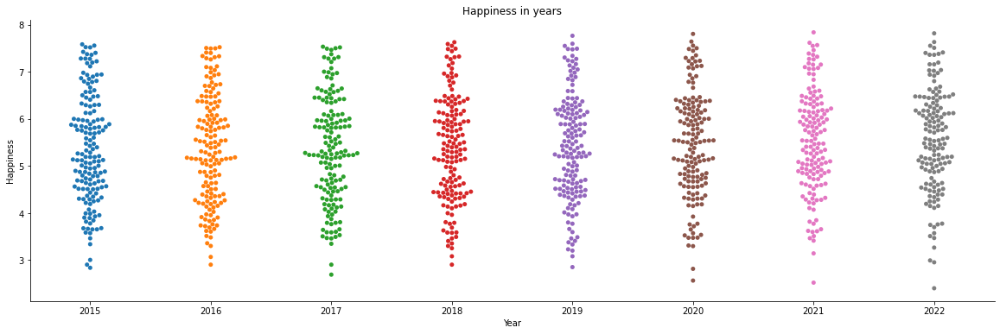

In [387]:
plt.figure(figsize=(20, 6))
sns.swarmplot(x='Year', y='Happiness', data=whr).set(title='Happiness in years')
plt.show()

The chart above, based on the World Happiness Reports from 2015-2022, shows that the level of global happiness shows no major deviations.

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Remove unnecessary characters from country names, unify country names, delete the last line. ** 

In [388]:
whr["Country"].unique()

array(['Switzerland', 'Iceland', 'Denmark', 'Norway', 'Canada', 'Finland',
       'Netherlands', 'Sweden', 'New Zealand', 'Australia', 'Israel',
       'Costa Rica', 'Austria', 'Mexico', 'United States', 'Brazil',
       'Luxembourg', 'Ireland', 'Belgium', 'United Arab Emirates',
       'United Kingdom', 'Oman', 'Venezuela', 'Singapore', 'Panama',
       'Germany', 'Chile', 'Qatar', 'France', 'Argentina',
       'Czech Republic', 'Uruguay', 'Colombia', 'Thailand',
       'Saudi Arabia', 'Spain', 'Malta', 'Taiwan', 'Kuwait', 'Suriname',
       'Trinidad and Tobago', 'El Salvador', 'Guatemala', 'Uzbekistan',
       'Slovakia', 'Japan', 'South Korea', 'Ecuador', 'Bahrain', 'Italy',
       'Bolivia', 'Moldova', 'Paraguay', 'Kazakhstan', 'Slovenia',
       'Lithuania', 'Nicaragua', 'Peru', 'Belarus', 'Poland', 'Malaysia',
       'Croatia', 'Libya', 'Russia', 'Jamaica', 'North Cyprus', 'Cyprus',
       'Algeria', 'Kosovo', 'Turkmenistan', 'Mauritius', 'Hong Kong',
       'Estonia', 'Indonesi

In [389]:
whr.Country.str.count("Congo").sum()

14

In [390]:
whr.Country.str.count("Brazzaville").sum()

7

In [391]:
whr.Country.str.count("Kinshasa").sum()

6

In [392]:
whr["Country"] = whr["Country"].str.replace("*","")
whr["Country"] = whr["Country"].replace('Czechia','Czech Republic', regex=True)
whr["Country"] = whr["Country"].replace('Hong Kong S.A.R., China','Hong Kong', regex=True)
whr["Country"] = whr["Country"].replace('Hong Kong S.A.R. of China','Hong Kong', regex=True)
whr["Country"] = whr["Country"].replace('Northern Cyprus','North Cyprus', regex=True)
whr["Country"] = whr["Country"].replace('Somaliland region','Somaliland Region', regex=True)
whr["Country"] = whr["Country"].replace('Taiwan Province of China','Taiwan', regex=True)
whr["Country"] = whr["Country"].replace('Trinidad & Tobago','Trinidad and Tobago', regex=True)
whr["Country"].unique()

array(['Switzerland', 'Iceland', 'Denmark', 'Norway', 'Canada', 'Finland',
       'Netherlands', 'Sweden', 'New Zealand', 'Australia', 'Israel',
       'Costa Rica', 'Austria', 'Mexico', 'United States', 'Brazil',
       'Luxembourg', 'Ireland', 'Belgium', 'United Arab Emirates',
       'United Kingdom', 'Oman', 'Venezuela', 'Singapore', 'Panama',
       'Germany', 'Chile', 'Qatar', 'France', 'Argentina',
       'Czech Republic', 'Uruguay', 'Colombia', 'Thailand',
       'Saudi Arabia', 'Spain', 'Malta', 'Taiwan', 'Kuwait', 'Suriname',
       'Trinidad and Tobago', 'El Salvador', 'Guatemala', 'Uzbekistan',
       'Slovakia', 'Japan', 'South Korea', 'Ecuador', 'Bahrain', 'Italy',
       'Bolivia', 'Moldova', 'Paraguay', 'Kazakhstan', 'Slovenia',
       'Lithuania', 'Nicaragua', 'Peru', 'Belarus', 'Poland', 'Malaysia',
       'Croatia', 'Libya', 'Russia', 'Jamaica', 'North Cyprus', 'Cyprus',
       'Algeria', 'Kosovo', 'Turkmenistan', 'Mauritius', 'Hong Kong',
       'Estonia', 'Indonesi

In [393]:
whr['Country'] =  whr['Country'].apply(lambda x: x.replace('(','').replace(')',''))
whr["Country"] = whr["Country"].replace(' Kinshasa','', regex=True)

In [394]:
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176


In [395]:
whr=whr.drop(whr.index[-1])

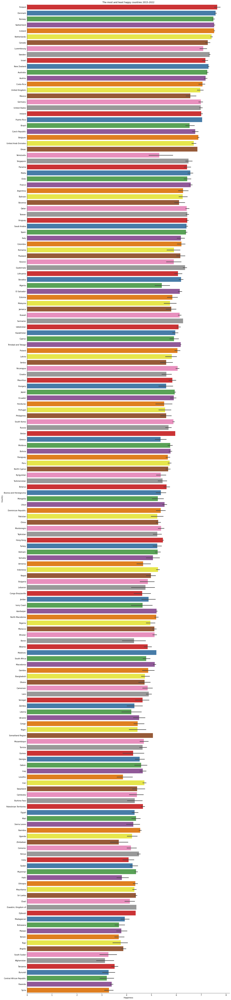

In [396]:
plt.figure(figsize = (20,100))

plt.title("The most and least happy countries 2015-2022")
sns.barplot(x = "Happiness", y = "Country", data = whr.sort_values(('Happiness'), ascending = (False)), palette = "Set1")
plt.show()

The chart above shows the happiness level from the highest to the lowest. 

In [397]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Happiness",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Happiness by Countries")
fig.show()

The above map shows changes in the level of happiness in individual countries between 2015 and 2022. 

In [398]:
fig = px.sunburst(data_frame=whr,
                  path=["Country"],
                  values="Happiness",
                  color="Happiness",
                  width=900, 
                  height=900)
fig.show()

In [399]:
%%html
<div class='tableauPlaceholder' id='viz1655659489658' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;5N&#47;5N3XZ67XH&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='shared&#47;5N3XZ67XH' /> <param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;5N&#47;5N3XZ67XH&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1655659489658');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.width='950px';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.width='950px';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else { vizElement.style.width='100%';vizElement.style.height='1027px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Interactive dashboard with data from the World Happiness Report (2015-2022) 

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Add data specifying broadband access. **

In [400]:
internet_coverage = pd.read_csv("broadband-penetration-by-country.csv")
internet_coverage.drop(['Code'], axis=1, inplace=True)

In [401]:
internet_coverage.head(3)

,Entity,Year,Fixed broadband subscriptions (per 100 people)
0,Afghanistan,2004,0.000809
1,Afghanistan,2005,0.000858
2,Afghanistan,2006,0.001892


In [402]:
internet_coverage.rename({'Entity': 'Country', 'Fixed broadband subscriptions (per 100 people)': 'Broadband'}, 
                         axis=1, inplace=True)

In [403]:
internet_coverage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4175 entries, 0 to 4174
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Country    4175 non-null   object 
 1   Year       4175 non-null   int64  
 2   Broadband  4175 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 98.0+ KB


In [404]:
whr = pd.merge(whr, internet_coverage, on=['Year', 'Country'], how='left')

In [405]:
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624


In [406]:
internet_coverage.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2019=internet_coverage.groupby(["Country"])[["BB"]].median()
broadband_2015_2019['Year']=2020
whr = pd.merge(whr, broadband_2015_2019, on=['Year','Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2020]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
782,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,30.106196
783,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,37.314551
784,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267,36.423566
785,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688,34.093804
786,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266,34.916832
...,...,...,...,...,...,...,...,...,...,...,...
930,2020,Central African Republic,3.4759,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637
931,2020,Rwanda,3.3123,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344
932,2020,Zimbabwe,3.2992,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682
933,2020,South Sudan,2.8166,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175


In [407]:
temp_whr = whr.copy()
temp_whr.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2020=temp_whr.groupby(["Country"])[["BB"]].median()
broadband_2015_2020['Year']=2021
whr = pd.merge(whr, broadband_2015_2020, on=['Year', 'Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2021]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
935,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253,31.296467
936,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868,43.458250
937,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839,45.307265
938,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967,39.398224
939,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798,42.679894
...,...,...,...,...,...,...,...,...,...,...,...
1079,2021,Lesotho,3.512,0.451,0.731,0.007,0.405,0.103,0.015,1.800,0.230501
1080,2021,Botswana,3.467,1.099,0.724,0.340,0.539,0.027,0.088,0.648,1.756953
1081,2021,Rwanda,3.415,0.364,0.202,0.407,0.627,0.227,0.493,1.095,0.126077
1082,2021,Zimbabwe,3.145,0.457,0.649,0.243,0.359,0.157,0.075,1.205,1.266664


In [408]:
whr.head(3)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164


In [409]:
temp_whr = whr.copy()
temp_whr.rename({'Broadband': 'BB'}, 
                         axis=1, inplace=True)
broadband_2015_2021=temp_whr.groupby(["Country"])[["BB"]].median()
broadband_2015_2021['Year']=2022
whr=pd.merge(whr, broadband_2015_2021, on=['Year', 'Country'], how='left')
whr['Broadband'] = whr['Broadband'].fillna(whr['BB'])
whr.drop(['BB'], axis=1, inplace=True)
whr.loc[whr['Year']==2022]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband
1084,2022,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2.518,31.296467
1085,2022,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2.226,43.458250
1086,2022,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2.320,39.398224
1087,2022,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2.153,45.307265
1088,2022,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2.137,42.679894
...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,0.187,1.756953
1226,2022,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,0.536,0.126077
1227,2022,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,0.548,1.266664
1228,2022,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,0.216,4.611091


An additional feature has been added - broadband Internet access. Due to the fact that there were no data for the years 2020 – 2022, they are determined by calculating the median from the years where values occur (for each country separately) and, for example, for the year 2020 the value is equal to the median of the values from the years 2015 - 2019, for the year 2021 the value is equal to the median of the years 2015 - 2020. The same for next years. 

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

*Add data - % of the population using the Internet individually. **

In [410]:
internet_individuals = pd.read_csv("internet_individuals.csv")
internet_individuals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Name  266 non-null    object 
 1   2015          248 non-null    float64
 2   2016          251 non-null    float64
 3   2017          253 non-null    float64
 4   2018          209 non-null    float64
 5   2019          203 non-null    float64
 6   2020          197 non-null    float64
dtypes: float64(6), object(1)
memory usage: 14.7+ KB


In [411]:
internet_individuals_2015 = internet_individuals.copy()
internet_individuals_2015.drop(['2016','2017','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2015.rename({'Country Name': 'Country', '2015': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2015['Year']=2015

internet_individuals_2016 = internet_individuals.copy()
internet_individuals_2016.drop(['2015','2017','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2016.rename({'Country Name': 'Country', '2016': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2016['Year']=2016

internet_individuals_2017 = internet_individuals.copy()
internet_individuals_2017.drop(['2015','2016','2018','2019','2020'], axis=1, inplace=True)
internet_individuals_2017.rename({'Country Name': 'Country', '2017': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2017['Year']=2017

internet_individuals_2018 = internet_individuals.copy()
internet_individuals_2018.drop(['2015','2016','2017','2019','2020'], axis=1, inplace=True)
internet_individuals_2018.rename({'Country Name': 'Country', '2018': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2018['Year']=2018

internet_individuals_2019 = internet_individuals.copy()
internet_individuals_2019.drop(['2015','2016','2017','2018','2020'], axis=1, inplace=True)
internet_individuals_2019.rename({'Country Name': 'Country', '2019': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2019['Year']=2019

internet_individuals_2020 = internet_individuals.copy()
internet_individuals_2020.drop(['2015','2016','2017','2018','2019'], axis=1, inplace=True)
internet_individuals_2020.rename({'Country Name': 'Country', '2020': 'Internet individuals'}, axis=1, inplace=True)
internet_individuals_2020['Year']=2020

new_internet_inidividuals = internet_individuals_2015.copy()
new_internet_inidividuals.append(internet_individuals_2016, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2017, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2018, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2019, ignore_index=True)
new_internet_inidividuals.append(internet_individuals_2020, ignore_index=True)

,Country,Internet individuals,Year
0,Aruba,88.661227,2015
1,Africa Eastern and Southern,14.625664,2015
2,Afghanistan,8.260000,2015
3,Africa Western and Central,18.192287,2015
4,Angola,22.000000,2015
...,...,...,...
527,Kosovo,NaN,2020
528,"Yemen, Rep.",NaN,2020
529,South Africa,70.000000,2020
530,Zambia,19.800000,2020


In [412]:
whr = pd.merge(whr, new_internet_inidividuals, on=['Year', 'Country'], how='left')

In [413]:
new_internet_inidividuals.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2019 = new_internet_inidividuals.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2019['Year']=2020
whr = pd.merge(whr, internet_inidividuals_2015_2019, on=['Year','Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2020]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
782,2020,Finland,7.8087,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,30.106196,86.422133
783,2020,Denmark,7.6456,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,37.314551,96.330502
784,2020,Switzerland,7.5599,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267,36.423566,87.479056
785,2020,Iceland,7.5045,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688,34.093804,98.200000
786,2020,Norway,7.4880,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266,34.916832,96.810326
...,...,...,...,...,...,...,...,...,...,...,...,...
930,2020,Central African Republic,3.4759,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637,2.900000
931,2020,Rwanda,3.3123,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344,18.000000
932,2020,Zimbabwe,3.2992,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682,22.742818
933,2020,South Sudan,2.8166,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175,3.000000


In [414]:
temp_II = whr.copy()
temp_II.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2020=temp_II.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2020['Year']=2021
whr = pd.merge(whr, internet_inidividuals_2015_2020, on=['Year','Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2021]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
935,2021,Finland,7.842,1.446,1.106,0.741,0.691,0.124,0.481,3.253,31.296467,86.422133
936,2021,Denmark,7.620,1.502,1.108,0.763,0.686,0.208,0.485,2.868,43.458250,96.330502
937,2021,Switzerland,7.571,1.566,1.079,0.816,0.653,0.204,0.413,2.839,45.307265,87.479056
938,2021,Iceland,7.554,1.482,1.172,0.772,0.698,0.293,0.170,2.967,39.398224,98.200000
939,2021,Netherlands,7.464,1.501,1.079,0.753,0.647,0.302,0.384,2.798,42.679894,91.724138
...,...,...,...,...,...,...,...,...,...,...,...,...
1079,2021,Lesotho,3.512,0.451,0.731,0.007,0.405,0.103,0.015,1.800,0.230501,25.000000
1080,2021,Botswana,3.467,1.099,0.724,0.340,0.539,0.027,0.088,0.648,1.756953,37.312050
1081,2021,Rwanda,3.415,0.364,0.202,0.407,0.627,0.227,0.493,1.095,0.126077,18.000000
1082,2021,Zimbabwe,3.145,0.457,0.649,0.243,0.359,0.157,0.075,1.205,1.266664,22.742818


In [415]:
temp_II = whr.copy()
temp_II.rename({'Internet individuals': 'II'}, 
                         axis=1, inplace=True)
internet_inidividuals_2015_2021=temp_II.groupby(["Country"])[["II"]].median()
internet_inidividuals_2015_2021['Year']=2022
whr = pd.merge(whr, internet_inidividuals_2015_2021, on=['Year', 'Country'], how='left')
whr['Internet individuals'] = whr['Internet individuals'].fillna(whr['II'])
whr.drop(['II'], axis=1, inplace=True)
whr.loc[whr['Year']==2022]

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals
1084,2022,Finland,7.821,1.892,1.258,0.775,0.736,0.109,0.534,2.518,31.296467,86.422133
1085,2022,Denmark,7.636,1.953,1.243,0.777,0.719,0.188,0.532,2.226,43.458250,96.330502
1086,2022,Iceland,7.557,1.936,1.320,0.803,0.718,0.270,0.191,2.320,39.398224,98.200000
1087,2022,Switzerland,7.512,2.026,1.226,0.822,0.677,0.147,0.461,2.153,45.307265,87.479056
1088,2022,Netherlands,7.415,1.945,1.206,0.787,0.651,0.271,0.419,2.137,42.679894,91.724138
...,...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.503,0.815,0.280,0.571,0.012,0.102,0.187,1.756953,37.312050
1226,2022,Rwanda,3.268,0.785,0.133,0.462,0.621,0.187,0.544,0.536,0.126077,18.000000
1227,2022,Zimbabwe,2.995,0.947,0.690,0.270,0.329,0.106,0.105,0.548,1.266664,22.742818
1228,2022,Lebanon,2.955,1.392,0.498,0.631,0.103,0.082,0.034,0.216,4.611091,74.000000


Added an additional feature - individual access to the Internet. Due to the fact that there were no data for the years 2020 - 2022. They are determined by calculating the average value for the years 2015 - 2019 (for each country separately), and for example for 2020 the value is equal to the value for 2019 plus the previously determined average. It's the same for years to come.


![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Summary of NaN values in whr. **

In [416]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.00
Country,object,False,0,0.00
Happiness,float64,False,0,0.00
GDP per capita,float64,False,0,0.00
Social support,float64,False,0,0.00
Life Exp,float64,False,0,0.00
Freedom,float64,False,0,0.00
Generosity,float64,False,0,0.00
Gov Corruption,float64,True,1,0.08
Dystopia Residual,float64,False,0,0.00


Nine columns contain empty values: Happiness, GDP per capita, Social support, Life Exp, Freedom, Generosity, Gov Corruption, Dystopia Residual

In the first seven columns these values are a clear minority (one or two).

For the first eight columns we replace the missing data with the most common value - mode.

In [417]:
mode_Happiness = whr['Happiness'].mode()[0]
mode_GDP_per_capita = whr['GDP per capita'].mode()[0]
mode_Social_support = whr['Social support'].mode()[0]
mode_Life_Exp = whr['Life Exp'].mode()[0]
mode_Freedom = whr['Freedom'].mode()[0]
mode_Generosity = whr['Generosity'].mode()[0]
mode_Gov_Corruption = whr['Gov Corruption'].mode()[0]
mode_Dystopia_Residual = whr['Dystopia Residual'].mode()[0]
mode_Broadband = whr['Broadband'].mode()[0]
mean_InternetIndividuals = whr['Internet individuals'].mean()

In [418]:
whr['Happiness'] = whr['Happiness'].fillna(mode_Happiness)
whr['GDP per capita'] = whr['GDP per capita'].fillna(mode_GDP_per_capita)
whr['Social support'] = whr['Social support'].fillna(mode_Social_support)
whr['Life Exp'] = whr['Life Exp'].fillna(mode_Life_Exp)
whr['Freedom'] = whr['Freedom'].fillna(mode_Freedom)
whr['Generosity'] = whr['Generosity'].fillna(mode_Generosity)
whr['Gov Corruption'] = whr['Gov Corruption'].fillna(mode_Gov_Corruption)
whr['Dystopia Residual'] = whr['Dystopia Residual'].fillna(mode_Dystopia_Residual)
whr['Broadband'] = whr['Broadband'].fillna(mode_Broadband)
whr['Internet individuals'] = whr['Internet individuals'].fillna(mean_InternetIndividuals)

In [419]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

In [536]:
%%html
<div class='tableauPlaceholder' id='viz1678828136674' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;ha&#47;happinesslevelInternet&#47;Dashboard1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='happinesslevelInternet&#47;Dashboard1' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;ha&#47;happinesslevelInternet&#47;Dashboard1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1678828136674');                    var vizElement = divElement.getElementsByTagName('object')[0];                    vizElement.style.width='820px';vizElement.style.height='387px';                    var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

Above is a graph showing the ratio of happiness to broadband Internet connection. 

In [421]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Broadband",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Broadband by Countries")
fig.show()

The map shows global broadband access (2015-2022). 

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

**Loading files with fertility data (average number of children born to a woman in a given country, in a given year). Prepare and add data to DataFrame whr. **

Loading data from 2015-2020

In [422]:
fer1520 = pd.read_excel('fertility15-20.xlsx') 
fer1520.head(5)

,Country,Year,Fertility
0,Aruba,2015,1.85
1,Aruba,2016,1.87
2,Aruba,2017,1.89
3,Aruba,2018,1.90
4,Aruba,2019,1.90


In [423]:
fer1520new_columns = ["Year","Country","Fertility"]
fer1520 = fer1520[fer1520new_columns]
fer1520.head(5)

,Year,Country,Fertility
0,2015,Aruba,1.85
1,2016,Aruba,1.87
2,2017,Aruba,1.89
3,2018,Aruba,1.90
4,2019,Aruba,1.90


Loading data from 2021-2022

In [424]:
fer21 = pd.read_csv("fertility2021.csv")
fer21.head(5)

,Country,Fertility
0,WORLD,2.3
1,AFRICA,4.3
2,NORTHERN AFRICA,2.9
3,Algeria,2.8
4,Egypt,2.7


In [425]:
fer21["Year"] = 2021

In [426]:
print(fer21.columns)

Index(['Country', 'Fertility   ', 'Year'], dtype='object')


In [427]:
fer21.rename({'Fertility   ': 'Fertility'}, axis=1, inplace=True)

In [428]:
fer21new_columns = ["Year","Country","Fertility"]
fer21 = fer21[fer21new_columns]

In [429]:
fer22 = pd.read_csv("fertility2022.csv")
fer22

,name,slug,value,date_of_information,ranking,region
0,Niger,niger,6.82,2022 est.,1,Africa
1,Angola,angola,5.83,2022 est.,2,Africa
2,"Congo, Democratic Republic of the",congo-democratic-republic-of-the,5.63,2022 est.,3,Africa
3,Mali,mali,5.54,2022 est.,4,Africa
4,Chad,chad,5.46,2022 est.,5,Africa
...,...,...,...,...,...,...
221,Italy,italy,1.22,2022 est.,223,Europe
222,Macau,macau,1.22,2022 est.,224,East and Southeast Asia
223,Singapore,singapore,1.16,2022 est.,225,East and Southeast Asia
224,"Korea, South",korea-south,1.10,2022 est.,226,East and Southeast Asia


In [430]:
fer22 = fer22.drop('slug', 1)
fer22 = fer22.drop('date_of_information', 1)
fer22 = fer22.drop('ranking', 1)
fer22 = fer22.drop('region', 1)
fer22.rename({'name': 'Country', 'value': 'Fertility'}, axis=1, inplace=True)
fer22['Year'] = 2022

In [431]:
fer22new_columns = ["Year","Country","Fertility"]
fer22 = fer22[fer22new_columns]

Combination into one DF

In [432]:
fer = pd.concat([fer1520, fer21, fer22], axis=0, ignore_index=True)
fer.head(5)

,Year,Country,Fertility
0,2015,Aruba,1.85
1,2016,Aruba,1.87
2,2017,Aruba,1.89
3,2018,Aruba,1.90
4,2019,Aruba,1.90


In [433]:
fer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1947 entries, 0 to 1946
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       1947 non-null   int64  
 1   Country    1947 non-null   object 
 2   Fertility  1947 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 45.8+ KB


Unification of country names

In [434]:
fer['Country'] = fer["Country"].replace('Czechia','Czech Republic', regex=True)
fer['Country'] = fer["Country"].replace('Egypt, Arab Rep.','Egypt', regex=True)
fer['Country'] = fer["Country"].replace('eSwatini','Eswatini', regex=True)
whr['Country'] = whr["Country"].replace(', Kingdom of','', regex=True)
fer['Country'] = fer["Country"].replace('Gambia, The','Gambia', regex=True)
fer['Country'] = fer["Country"].replace('China Hong Kong SAR','Hong Kong', regex=True)
fer['Country'] = fer["Country"].replace('Hong Kong SAR, China','Hong Kong', regex=True)
fer['Country'] = fer["Country"].replace('Iran, Islamic Rep.','Iran', regex=True)
fer['Country'] = fer["Country"].replace('Palestinian Territory','Palestinian Territories', regex=True)
fer['Country'] = fer["Country"].replace('Russian Federation','Russia', regex=True)
fer['Country'] = fer["Country"].replace('Korea South','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Korea, Rep.','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Korea, South','South Korea', regex=True)
fer['Country'] = fer["Country"].replace('Syrian Arab Republic','Syria', regex=True)
fer['Country'] = fer["Country"].replace('Venezuela, RB','Venezuela', regex=True)
fer['Country'] = fer["Country"].replace('Yemen, Rep.','Yemen', regex=True)


In [435]:
print(f'Congo: {fer.Country.str.count("Congo").sum()}')
print(f'Congo Dem. Rep.: {fer.Country.str.count("Congo Dem. Rep.").sum()}')
print(f'Congo, Dem. Rep.: {fer.Country.str.count("Congo, Dem. Rep.").sum()}')
print(f'Congo, Democratic Republic of the: {fer.Country.str.count("Congo, Democratic Republic of the").sum()}')
print(f'Congo, Rep.: {fer.Country.str.count("Congo, Rep.").sum()}')
print(f'Congo, Republic of the: {fer.Country.str.count("Congo, Republic of the").sum()}')

Congo: 16
Congo Dem. Rep.: 1
Congo, Dem. Rep.: 6
Congo, Democratic Republic of the: 1
Congo, Rep.: 7
Congo, Republic of the: 1


In [436]:
fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo, Republic of the','Congo Brazzaville'))

fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo, Rep.','Congo Brazzaville'))

fer['Country'] =  fer['Country'].apply(lambda x: x.replace('Congo Dem. Rep.',
                                                           'Congo').replace('Congo, Dem. Rep.',
                                                            'Congo').replace('Congo, Democratic Republic of the', 'Congo'))

Combination of whr and fer

In [437]:
whr = pd.merge(whr, fer, how='left')
whr.head(5)

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167,96.810326,1.72
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624,90.000000,1.60


Due to missing data for some countries, we cover the gaps with an average for a given country

In [438]:
filtered = whr[whr["Country"] == "Taiwan"]

In [439]:
filtered["Fertility"].mean()

1.04

In [440]:
whr[whr["Country"] == "Taiwan"] = whr[whr["Country"] == "Taiwan"].fillna(value=filtered["Fertility"].mean())

In [441]:
filslovakia = whr[whr["Country"] == "Slovakia"]
whr[whr["Country"] == "Slovakia"] = whr[whr["Country"] == "Slovakia"].fillna(value=filslovakia["Fertility"].mean())

In [442]:
filkyrgyzstan = whr[whr["Country"] == "Kyrgyzstan"]
whr[whr["Country"] == "Kyrgyzstan"] = whr[whr["Country"] == "Kyrgyzstan"].fillna(value=filkyrgyzstan["Fertility"].mean())

In [443]:
fillaos = whr[whr["Country"] == "Laos"]
whr[whr["Country"] == "Laos"] = whr[whr["Country"] == "Laos"].fillna(value=fillaos["Fertility"].mean())

In [444]:
filpales = whr[whr["Country"] == "Palestinian Territories"]
whr[whr["Country"] == "Palestinian Territories"] = whr[whr["Country"] == "Palestinian Territories"].fillna(
    value=filpales["Fertility"].mean())

In [445]:
filbosnia = whr[whr["Country"] == "Bosnia and Herzegovina"]
whr[whr["Country"] == "Bosnia and Herzegovina"] = whr[whr["Country"] == "Bosnia and Herzegovina"].fillna(
    value=filbosnia["Fertility"].mean())

In [446]:
filcongo = whr[whr["Country"] == "Congo Brazzaville"]
whr[whr["Country"] == "Congo Brazzaville"] = whr[whr["Country"] == "Congo Brazzaville"].fillna(
    value=filcongo["Fertility"].mean())

In [447]:
filturk = whr[whr["Country"] == "Turkey"]
whr[whr["Country"] == "Turkey"] = whr[whr["Country"] == "Turkey"].fillna(value=filturk["Fertility"].mean())

In [448]:
filmyanmar = whr[whr["Country"] == "Myanmar"]
whr[whr["Country"] == "Myanmar"] = whr[whr["Country"] == "Myanmar"].fillna(value=filmyanmar["Fertility"].mean())

In [449]:
whr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 0 to 1229
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  1230 non-null   int64  
 1   Country               1230 non-null   object 
 2   Happiness             1230 non-null   float64
 3   GDP per capita        1230 non-null   float64
 4   Social support        1230 non-null   float64
 5   Life Exp              1230 non-null   float64
 6   Freedom               1230 non-null   float64
 7   Generosity            1230 non-null   float64
 8   Gov Corruption        1230 non-null   float64
 9   Dystopia Residual     1230 non-null   float64
 10  Broadband             1230 non-null   float64
 11  Internet individuals  1230 non-null   float64
 12  Fertility             1203 non-null   float64
dtypes: float64(11), int64(1), object(1)
memory usage: 134.5+ KB


27 NaN left

In [450]:
print(str(round(whr['Fertility'].isnull().sum()/whr['Fertility'].shape[0]*100,2))+
      '% of observations in Fertility column have NaN values.')

2.2% of observations in Fertility column have NaN values.


We have decided to replace null values in the Fertility column with the most common value (mode).

In [451]:
mode_Fertility = whr['Fertility'].mode()[0]

In [452]:
whr['Fertility'] = whr['Fertility'].fillna(mode_Fertility)

In [453]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


In [454]:
whr.head()

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167,96.810326,1.72
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624,90.000000,1.60


In [455]:
whr_broadband = whr.iloc[:,[0,1,2,10,11]]
whr_broadband = whr_broadband.sample(n=10)
whr_broadband.to_csv('whr_broadband_internet.csv')

In [456]:
fig = px.choropleth(whr.sort_values("Year"), 
                    locations = "Country", 
                    color = "Fertility",
                    locationmode = "country names",
                    animation_frame = "Year")
fig.update_layout(title = "Fertility by Countries")
fig.show()

The map shows the level of fertility in the countries of the world. 

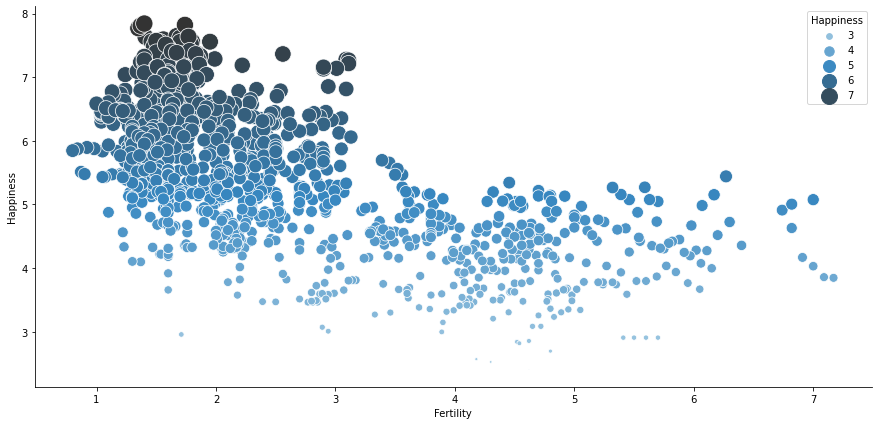

In [457]:
fig, ax = plt.subplots(figsize=(15,7))

sns.scatterplot(x='Fertility', y='Happiness', data=whr, 
                hue='Happiness',palette="Blues_d", 
                size='Happiness', sizes=(0.3, 300))

plt.show()

As we can see in the graph, the greatest satisfaction is when the number of children born is between one and three children.

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Sunshine

### Sunlight is the total time (in hours) during a given period (usually a day or a year) when the Sun's rays fall directly on a specific location on the Earth.

**Loading the set of sunshine hours by city and removing unnecessary columns. Adding the median values for countries where there is more than 1 reading. **

In [458]:
sunshine = pd.read_csv('sunshine hours by city.csv')
sunshine.rename({'Year': 'Annual sunshine'}, axis=1, inplace=True)
sunshine.drop(['City', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 
               'Dec'], axis=1, inplace=True)
sunshine = sunshine.groupby(["Country"])[["Annual sunshine"]].median()
sunshine.reset_index(inplace = True)
sunshine

,Country,Annual sunshine
0,Afghanistan,3175.1
1,Albania,2544.0
2,Algeria,3266.5
3,Angola,2341.0
4,Argentina,2404.2
...,...,...
135,Uzbekistan,2823.9
136,Venezuela,2894.8
137,Vietnam,2210.0
138,Zambia,2935.7


In [459]:
fig = px.choropleth(sunshine.sort_values("Annual sunshine"), 
                    locations = "Country", 
                    color = "Annual sunshine",
                    locationmode = "country names")
fig.update_layout(title = "Annual sunshine")
fig.show()

The above table shows the sun exposure of individual countries of the world in our collection. 

**Adding sunshine harvest to whr**

In [460]:
whr = pd.merge(whr, sunshine, on='Country', how='left')
whr

,Year,Country,Happiness,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,2015,Switzerland,7.587,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54,2003.5
1,2015,Iceland,7.561,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80,1326.0
2,2015,Denmark,7.527,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71,1912.0
3,2015,Norway,7.522,1.45900,1.33095,0.88521,0.66973,0.34699,0.36503,2.46531,39.433167,96.810326,1.72,1265.0
4,2015,Canada,7.427,1.32629,1.32261,0.90563,0.63297,0.45811,0.32957,2.45176,36.404624,90.000000,1.60,2051.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1225,2022,Botswana,3.471,1.50300,0.81500,0.28000,0.57100,0.01200,0.10200,0.18700,1.756953,37.312050,2.39,3371.0
1226,2022,Rwanda,3.268,0.78500,0.13300,0.46200,0.62100,0.18700,0.54400,0.53600,0.126077,18.000000,3.33,NaN
1227,2022,Zimbabwe,2.995,0.94700,0.69000,0.27000,0.32900,0.10600,0.10500,0.54800,1.266664,22.742818,3.89,3065.4
1228,2022,Lebanon,2.955,1.39200,0.49800,0.63100,0.10300,0.08200,0.03400,0.21600,4.611091,74.000000,1.71,NaN


In [461]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.00
Country,object,False,0,0.00
Happiness,float64,False,0,0.00
GDP per capita,float64,False,0,0.00
Social support,float64,False,0,0.00
Life Exp,float64,False,0,0.00
Freedom,float64,False,0,0.00
Generosity,float64,False,0,0.00
Gov Corruption,float64,False,0,0.00
Dystopia Residual,float64,False,0,0.00


In [462]:
print(str(round(whr['Annual sunshine'].isnull().sum()/whr['Annual sunshine'].shape[0]*100,2))+
      '% of observations in Annual sunshine column have NaN values.')

22.93% of observations in Annual sunshine column have NaN values.


We have decided to replace null values in the Fertility column with the most common value (mode).

In [463]:
median_Annual_sunshine = whr['Annual sunshine'].median()

In [464]:
whr['Annual sunshine'] = whr['Annual sunshine'].fillna(median_Annual_sunshine)

In [465]:
summary = pd.DataFrame(whr.dtypes, columns=['Dtype'])
summary['Nulls'] = pd.DataFrame(whr.isnull().any())
summary['Sum_of_nulls'] = pd.DataFrame(whr.isnull().sum())
summary['Per_of_nulls'] = round((whr.apply(pd.isnull).mean()*100), 2)
summary.Dtype = summary.Dtype.astype(str)
summary

,Dtype,Nulls,Sum_of_nulls,Per_of_nulls
Year,int64,False,0,0.0
Country,object,False,0,0.0
Happiness,float64,False,0,0.0
GDP per capita,float64,False,0,0.0
Social support,float64,False,0,0.0
Life Exp,float64,False,0,0.0
Freedom,float64,False,0,0.0
Generosity,float64,False,0,0.0
Gov Corruption,float64,False,0,0.0
Dystopia Residual,float64,False,0,0.0


In [466]:
whr_sunshine = whr.iloc[:,[1,2,13]]
whr_sunshine = whr_sunshine.sample(n=20)

whr_sunshine.to_csv('whr_sunshine.csv')

**The dependence of happiness on the degree of sunshine is shown in the graph below**

In [467]:
%%html
<div class='tableauPlaceholder' id='viz1678827559275' style='position: relative'><noscript><a href='#'><img alt='Dashboard 2 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;ha&#47;happinesslevel_16787490332260&#47;Dashboard2&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='site_root' value='' /><param name='name' value='happinesslevel_16787490332260&#47;Dashboard2' /><param name='tabs' value='no' /><param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;ha&#47;happinesslevel_16787490332260&#47;Dashboard2&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1678827559275');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.width='1066px';vizElement.style.height='527px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.width='1066px';vizElement.style.height='527px';} else { vizElement.style.width='100%';vizElement.style.height='727px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

As you can see, happiness is not always dependent on the number of sunny days. It is also affected by other factors. 

In [468]:
whr.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,1230.0,2018.447154,2.282716,2015.000000,2016.000000,2018.000000,2020.000000,2022.000000
Happiness,1230.0,5.430092,1.115361,2.404000,4.584500,5.410500,6.226225,7.842000
GDP per capita,1230.0,0.976255,0.435247,0.000000,0.668250,1.013580,1.295961,2.209000
Social support,1230.0,1.032984,0.329526,0.000000,0.824771,1.069168,1.273395,1.644000
Life Exp,1230.0,0.608132,0.241249,0.000000,0.439250,0.639427,0.790795,1.141000
Freedom,1230.0,0.440833,0.154415,0.000000,0.344250,0.458135,0.559000,0.740000
Generosity,1230.0,0.201583,0.115522,0.000000,0.118000,0.186984,0.258494,0.838075
Gov Corruption,1230.0,0.130702,0.110789,0.000000,0.056000,0.095833,0.163940,0.587000
Dystopia Residual,1230.0,2.039667,0.573982,0.184000,1.686035,2.062335,2.421914,3.837720
Broadband,1230.0,12.553548,13.704750,0.000426,0.270966,7.197071,23.627081,46.901104


In [469]:
%%html
<div class='tableauPlaceholder' id='viz1656796056825' style='position: relative'><noscript><a href='#'><img alt='Dashboard 1 ' src='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;wh&#47;whr-full&#47;Dashboard1&#47;1_rss.png' style='border: none' /></a></noscript><object class='tableauViz'  style='display:none;'><param name='host_url' value='https%3A%2F%2Fpublic.tableau.com%2F' /> <param name='embed_code_version' value='3' /> <param name='path' value='views&#47;whr-full&#47;Dashboard1?:language=en-US&amp;:embed=true&amp;publish=yes' /> <param name='toolbar' value='yes' /><param name='static_image' value='https:&#47;&#47;public.tableau.com&#47;static&#47;images&#47;wh&#47;whr-full&#47;Dashboard1&#47;1.png' /> <param name='animate_transition' value='yes' /><param name='display_static_image' value='yes' /><param name='display_spinner' value='yes' /><param name='display_overlay' value='yes' /><param name='display_count' value='yes' /><param name='language' value='en-US' /><param name='filter' value='publish=yes' /></object></div>                <script type='text/javascript'>                    var divElement = document.getElementById('viz1656796056825');                    var vizElement = divElement.getElementsByTagName('object')[0];                    if ( divElement.offsetWidth > 800 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='1000px';vizElement.style.width='100%';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else if ( divElement.offsetWidth > 500 ) { vizElement.style.minWidth='950px';vizElement.style.maxWidth='1000px';vizElement.style.width='100%';vizElement.style.minHeight='727px';vizElement.style.maxHeight='1107px';vizElement.style.height=(divElement.offsetWidth*0.75)+'px';} else { vizElement.style.width='100%';vizElement.style.height='1577px';}                     var scriptElement = document.createElement('script');                    scriptElement.src = 'https://public.tableau.com/javascripts/api/viz_v1.js';                    vizElement.parentNode.insertBefore(scriptElement, vizElement);                </script>

![green-divider](https://i.postimg.cc/BvHNGMgG/blue.png)

## 4. Creating machine learning models. 

Happiness will be our y, the other qualities are our X.

Let's see how the data distribution looks like for our y – Happiness column: 

In [470]:
whr['Happiness'].describe()

count    1230.000000
mean        5.430092
std         1.115361
min         2.404000
25%         4.584500
50%         5.410500
75%         6.226225
max         7.842000
Name: Happiness, dtype: float64

The median is 5. 41 and the mean is 5. 43 so y will be minimally oblique. 

Our data is a time series. Let's see how the level of happiness changes over time

<AxesSubplot:xlabel='Year'>

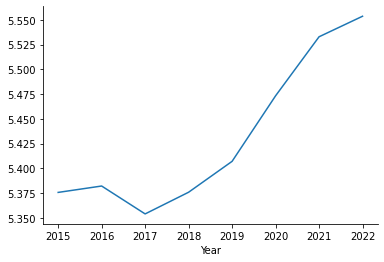

In [471]:
whr.groupby(['Year'])['Happiness'].mean().plot()

As you can see on the chart above, the average level of happiness oscillates between 5. 3 - 5. 6. Since 2017 the level of happiness has been on the upward trend. 

### Histogram

Distribution of our variable:

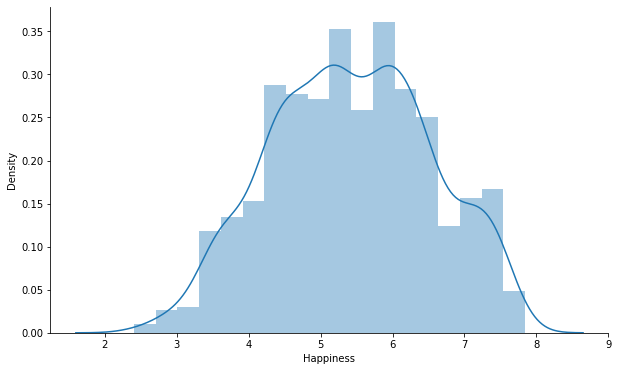

In [472]:
plt.figure(figsize=(10, 6))
sns.distplot(whr['Happiness'])
plt.show()

We check the effect of explanatory variables on the dependent variable.

As you can see, the highest density of happiness is between 4 and 7.

### Indicating which variables are our X and which are our y 

In [473]:
numeric_features = ['GDP per capita', 'Social support', 'Life Exp', 'Freedom', 'Generosity', 
                    'Gov Corruption', 'Dystopia Residual', 'Broadband', 
                    'Internet individuals', 'Fertility', 'Annual sunshine']
categorical_features = ['Year', 'Country']
target = 'Happiness' 

In [474]:
X = whr[numeric_features].copy()

y = whr[target].copy()

display(X.iloc[:3])
display(y.iloc[:3])

,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,1.39651,1.34951,0.94143,0.66557,0.29678,0.41978,2.51738,44.602427,87.479056,1.54,2003.5
1,1.30232,1.40223,0.94784,0.62877,0.43630,0.14145,2.70201,37.680133,98.200000,1.80,1326.0
2,1.32548,1.36058,0.87464,0.64938,0.34139,0.48357,2.49204,42.276164,96.330502,1.71,1912.0


0    7.587
1    7.561
2    7.527
Name: Happiness, dtype: float64

Checking the correlation for our numerical features: 

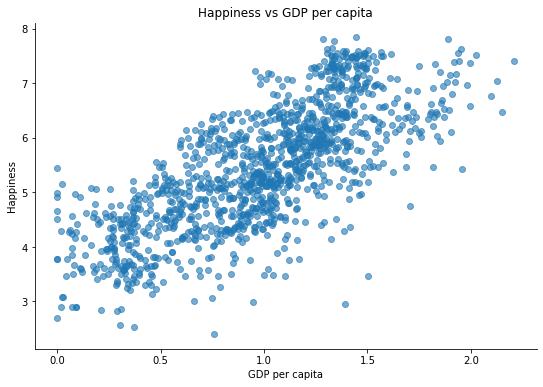

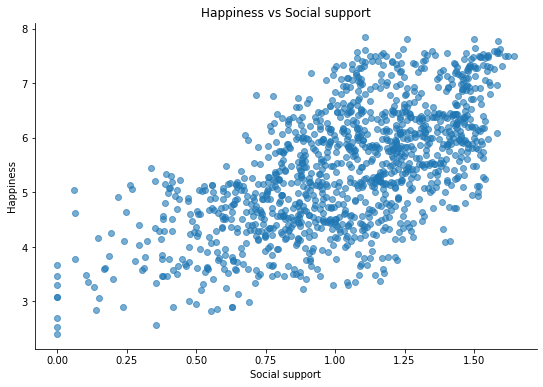

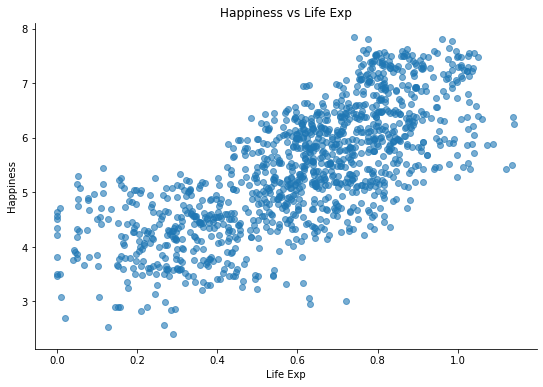

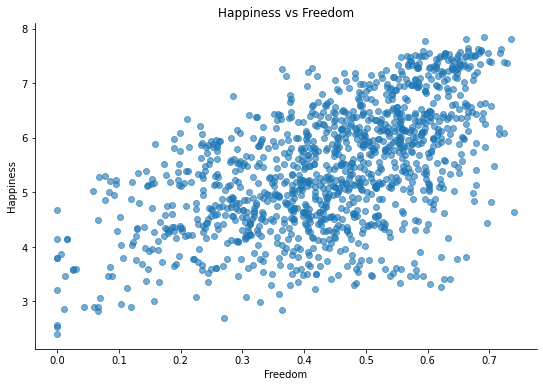

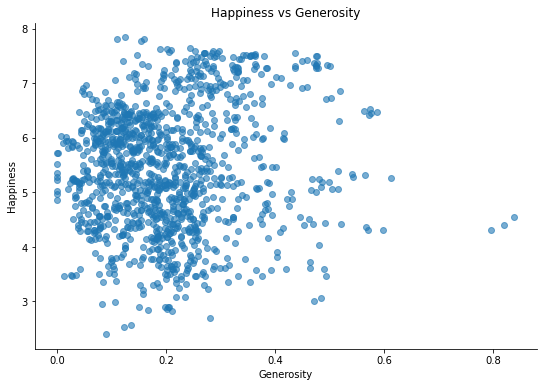

...

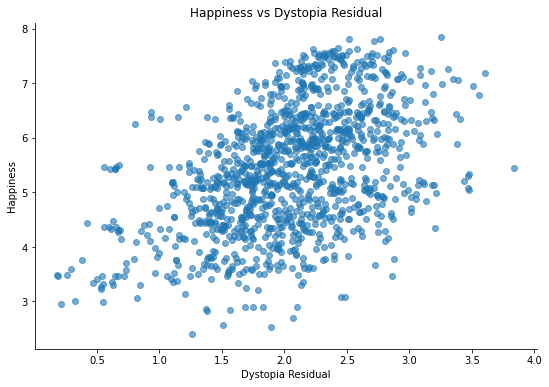

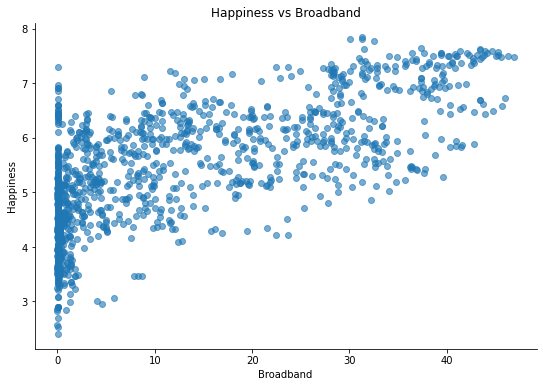

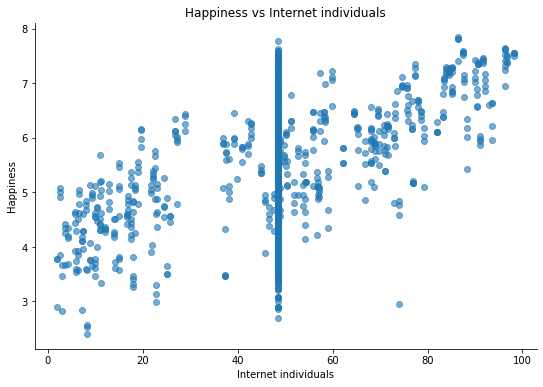

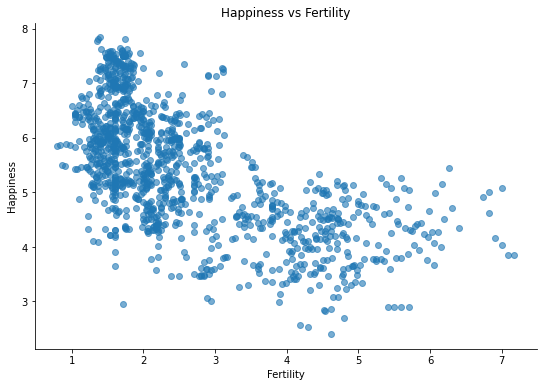

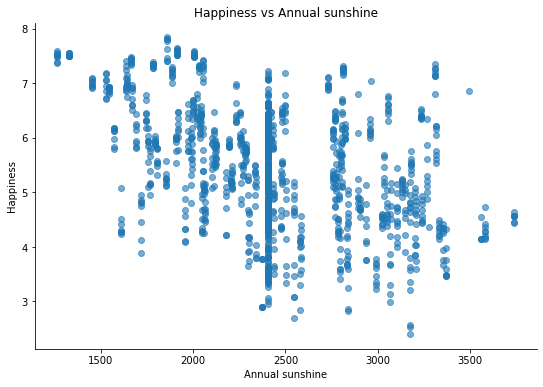

In [475]:
for numeric_feature in numeric_features:
    fig = plt.figure(figsize=(9, 6))
    
    plt.scatter(whr[numeric_feature], whr[target], alpha=0.6)
    plt.xlabel(numeric_feature)
    plt.ylabel('Happiness')  
    plt.title(f'Happiness vs {numeric_feature}') 
    plt.show()

Checking if there is a relationship between our features: 

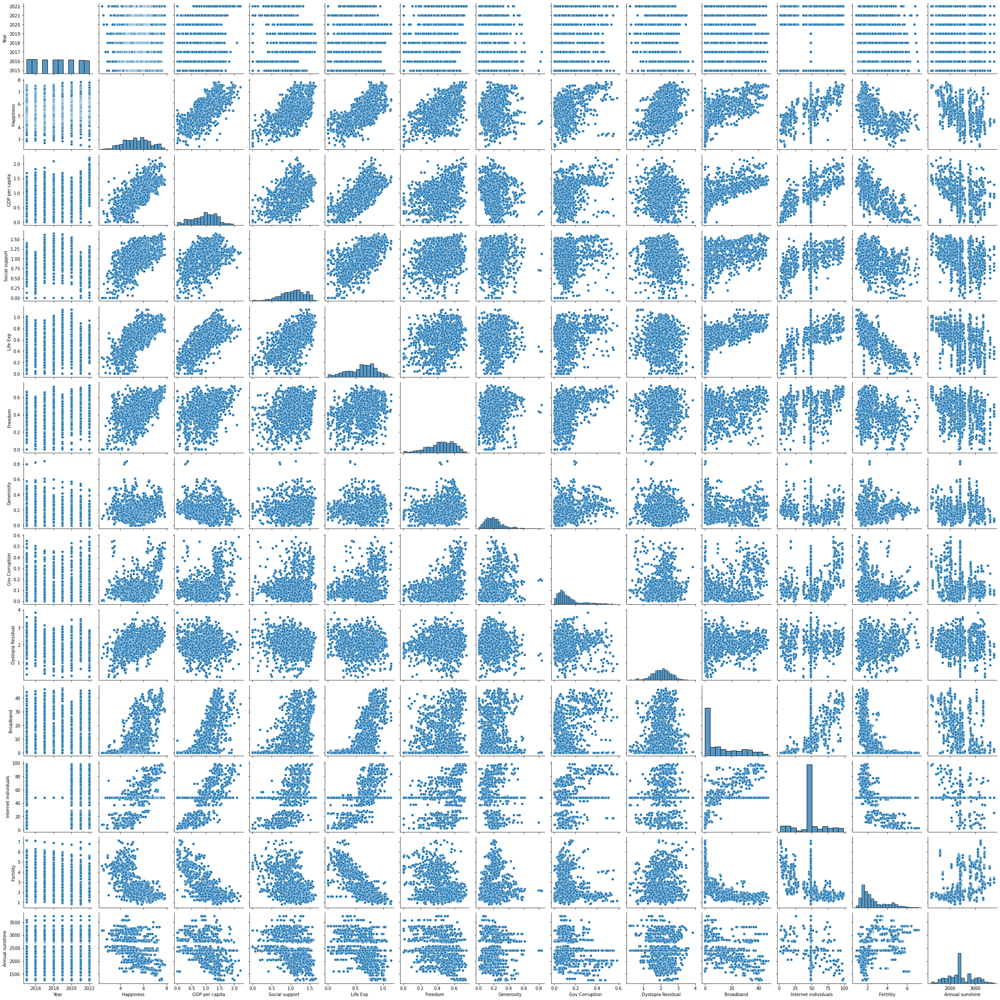

In [476]:
sns.pairplot(whr)

**Creating a correlation matrix for our numerical variables:**

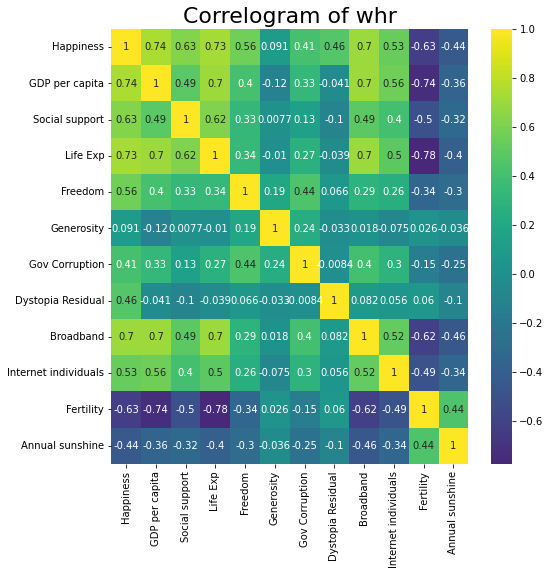

In [477]:
plt.figure(figsize=(8, 8))
ax = sns.heatmap(whr[[target]+numeric_features].corr(), cmap='viridis', center=0, annot=True)    
plt.title('Correlogram of whr', fontsize=22)
plt.show()

The correlation graph shows that the most correlated with Happiness are GDP per capita, Life exp, Broadband, Social support and Fertility (negative correlation). 

Now let's check our categorical variable Year:

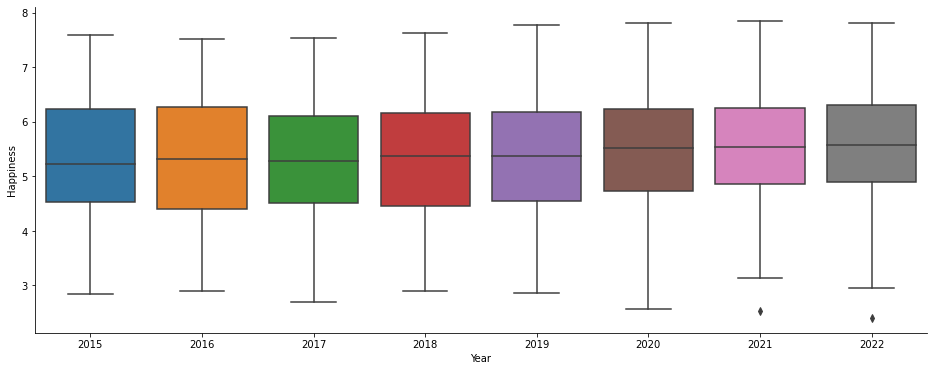

In [478]:
plt.figure(figsize=(16, 6))
sns.boxplot(y=whr[target], x=whr['Year'])
plt.show()

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Splitting into training and test sets 

In [479]:
X_train = whr.drop(['Happiness'], axis=1)
X_train = X_train.loc[X_train['Year']<2021]

X_test = whr.drop(['Happiness'], axis=1)
X_test = X_test.loc[X_test['Year']>=2021]

y_train = whr.loc[whr['Year']<2021]
y_train = y_train['Happiness']

y_test = whr.loc[whr['Year']>=2021]
y_test = y_test['Happiness']

**Standardization** 

In [480]:
X_train = X_train.drop(['Year','Country'], axis=1)
X_test = X_test.drop(['Year','Country'], axis=1)

In [481]:
X_train

,GDP per capita,Social support,Life Exp,Freedom,Generosity,Gov Corruption,Dystopia Residual,Broadband,Internet individuals,Fertility,Annual sunshine
0,1.396510,1.349510,0.941430,0.665570,0.296780,0.419780,2.517380,44.602427,87.479056,1.54,2003.5
1,1.302320,1.402230,0.947840,0.628770,0.436300,0.141450,2.702010,37.680133,98.200000,1.80,1326.0
2,1.325480,1.360580,0.874640,0.649380,0.341390,0.483570,2.492040,42.276164,96.330502,1.71,1912.0
3,1.459000,1.330950,0.885210,0.669730,0.346990,0.365030,2.465310,39.433167,96.810326,1.72,1265.0
4,1.326290,1.322610,0.905630,0.632970,0.458110,0.329570,2.451760,36.404624,90.000000,1.60,2051.0
...,...,...,...,...,...,...,...,...,...,...,...
930,0.041072,0.000000,0.000000,0.292814,0.253513,0.028265,2.860198,0.013637,2.900000,4.57,2546.5
931,0.343243,0.522876,0.572383,0.604088,0.235705,0.485542,0.548445,0.033344,18.000000,3.93,2404.2
932,0.425564,1.047835,0.375038,0.377405,0.151349,0.080929,0.841031,0.263682,22.742818,3.46,3065.4
933,0.289083,0.553279,0.208809,0.065609,0.209935,0.111157,1.378751,0.001175,3.000000,4.54,2841.3


In [482]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [483]:
# Po standaryzacji:

whr['Happiness'].agg(['min','max','mean','std'])

min     2.404000
max     7.842000
mean    5.430092
std     1.115361
Name: Happiness, dtype: float64

**Linear Regression**

**We train our model**

In [484]:
from sklearn.linear_model import LinearRegression

In [485]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

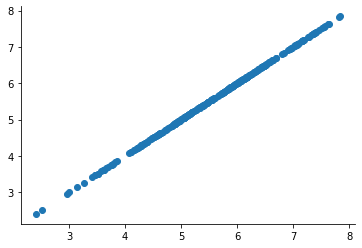

In [486]:
plt.scatter(lr_model.predict(X_test), y_test)

**Making predictions for training and test set**

In [487]:
y_predict_train = lr_model.predict(X_train)
y_predict_test = lr_model.predict(X_test)

**Dummy model**

In [488]:
dummy_model = DummyRegressor(strategy='mean')  
dummy_model.fit(X_train, y_train)

DummyRegressor()

**Prediction on training and test**

In [489]:
y_train_dummy = dummy_model.predict(X_train)
y_test_dummy = dummy_model.predict(X_test)

**Errors for dummy model**

In [490]:
MAE_dummy_train = mean_absolute_error(y_train, y_train_dummy)
MAE_dummy_test = mean_absolute_error(y_test, y_test_dummy)
MAPE_dummy_test = mean_absolute_percentage_error(y_test, y_test_dummy)*100
MSE_dummy = mean_squared_error(y_test, y_test_dummy)
RMSE_dummy = sqrt(MSE_dummy)

**Test dummy modelu**

In [491]:
y_test_dummy[:5] 

array([5.39443604, 5.39443604, 5.39443604, 5.39443604, 5.39443604])

**Testowego**

In [492]:
y_predict_test[:5]

array([7.84169399, 7.61967613, 7.56948909, 7.55338132, 7.46350475])

**Regression factors**

In [493]:
lr_model.intercept_

5.394436041883378

In [494]:
lr_model.coef_

array([ 4.01135818e-01,  3.24132551e-01,  2.50962134e-01,  1.52130433e-01,
        1.19365634e-01,  1.07020516e-01,  5.57558748e-01, -3.31388244e-06,
        7.91185156e-05, -1.26956810e-04,  1.58857515e-05])

**Errors** 

**MAE**

In [495]:
MAE_rl_model_train = mean_absolute_error(y_train, y_predict_train)
MAE_rl_model_test = mean_absolute_error(y_test, y_predict_test)

print('Train:')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model: {MAE_rl_model_train}')
print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model: {MAE_rl_model_test}')

Train:
MAE Dummy: 0.9348458158942521
MAE RL Model: 0.0004052732823592803

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model: 0.0008919485434621864


In [496]:
(0.0009031060450573293 - 0.00040196006352908437) / 0.00040196006352908437

1.2467556531072739

Mean absolute error is about 1. 246 - this is the difference between the true value and our forecast

**MAPE (%)**

In [497]:
MAPE_rl_model_test = mean_absolute_percentage_error(y_test, y_predict_test)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE RL Model: {MAPE_rl_model_test}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE RL Model: 0.016696443062697408%


**MSE**

In [498]:
MSE_rl_model = mean_squared_error(y_test, y_predict_test)   

print('Test:')
print(f'MSE Dummy MSE: {MSE_dummy}')
print(f'MSE RL Model MSE: {MSE_rl_model}')

Test:
MSE Dummy MSE: 1.1814226728291994
MSE RL Model MSE: 1.2522978600924872e-06


**RMSE (pierwiastek z MSE)**

In [499]:
RMSE_rl_model = sqrt(MSE_rl_model)

print('Test:')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE RL Model: {RMSE_rl_model}')

Test:
RMSE Dummy: 1.0869326901097416
RMSE RL Model: 0.0011190611511854422


In [500]:
mean_squared_error(y_test, y_predict_test, squared=False)

0.0011190611511854422

We see that Dummy model is wrong for about 1. 086932, while our model is wrong for about 0. 001119

![grey-divider](https://i.postimg.cc/KvZkWwxT/grey.png)

### Visual evaluation of the model 

**Comparison of true value with prediction**

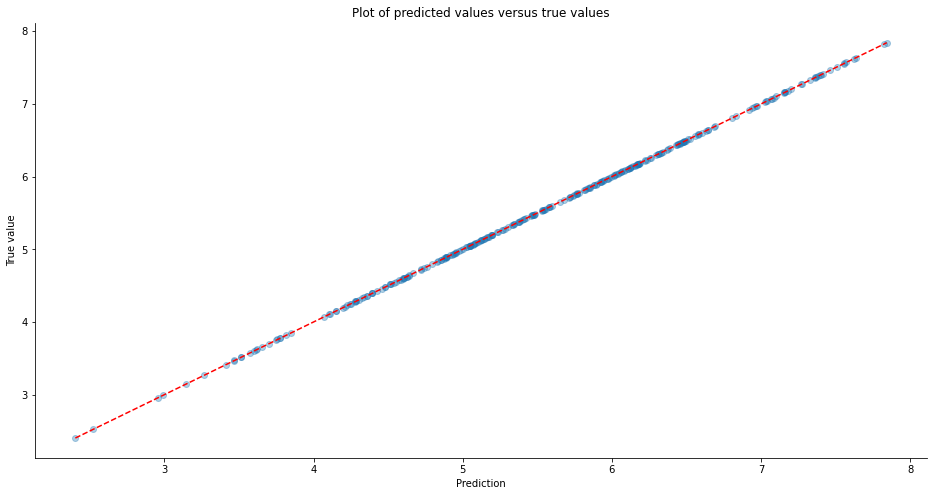

In [501]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test, y = y_test, alpha=0.35)

xmin, xmax = y_test.min(), y_test.max()
x_line = np.linspace(xmin, xmax, 10)   
y_line = x_line

# Oczekiwana linia trendu

plt.plot(x_line, y_line, 'r--')  


plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')
plt.show()

The linear regression model predicts results with an accuracy close to 100%.

### Residue chart

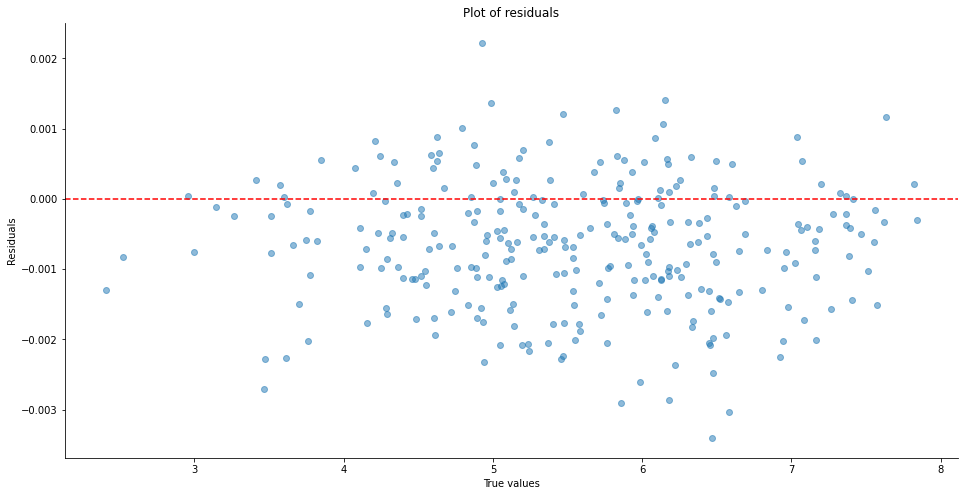

Error mean: -0.0006713282423767257


In [502]:
errors = y_predict_test - y_test
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors.mean()}')

### Residue Histogram 

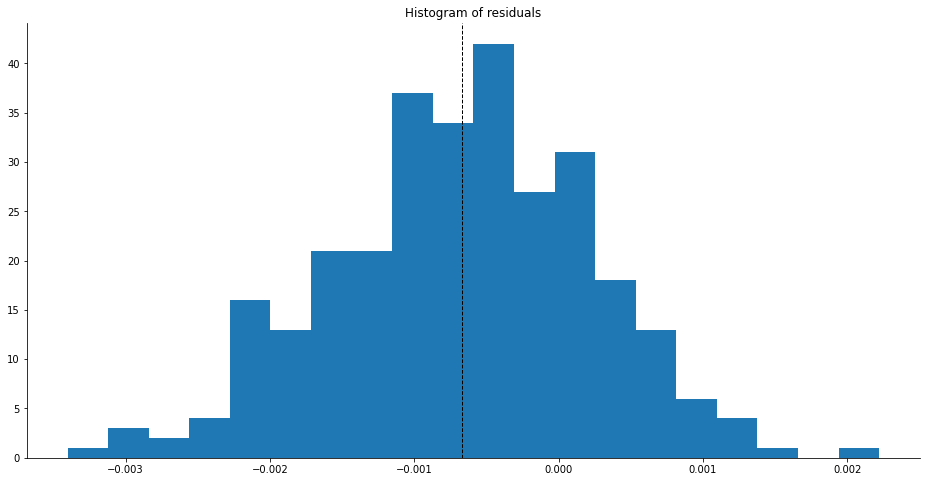

In [503]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors, bins=20)

plt.axvline(errors.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

### The Decision Tree 

In [504]:
X = whr[numeric_features].copy()
y = whr[target].copy()

**Trenujemy model**

In [505]:
model_tree = DecisionTreeRegressor()
model_tree.fit(X_train, y_train)

DecisionTreeRegressor()

**Prediction** 

In [506]:
y_predict_train_tree = model_tree.predict(X_train)
y_predict_test_tree = model_tree.predict(X_test)

In [507]:
y_predict_train_tree[:5]

array([7.587, 7.561, 7.527, 7.522, 7.427])

In [508]:
y_predict_test_tree[:5] 

array([7.632, 7.632, 7.632, 7.594, 7.594])

**Comparison of true value with prediction**

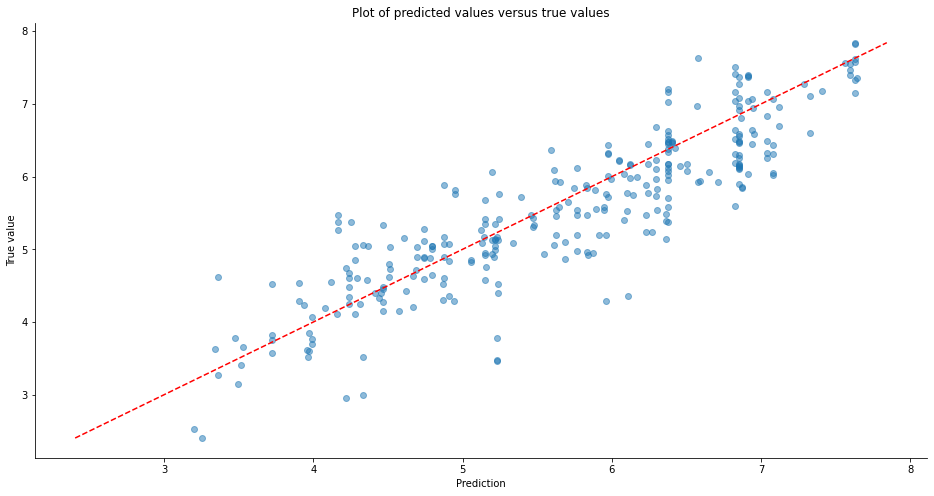

In [509]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test_tree, y = y_test, alpha=0.5)


xmin_tree, xmax_tree = y_test.min(), y_test.max()
x_line_tree = np.linspace(xmin_tree, xmax_tree, 10)   
y_line_tree = x_line_tree

# Oczekiwana linia trendu

plt.plot(x_line_tree, y_line_tree, 'r--')  


plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')

plt.show()

The decision tree model is proving to be a bad choice for this problem. 

**Errors** 

**MAE for decision tree** 

In [510]:
MAE_rl_model_train_tree = mean_absolute_error(y_train, y_predict_train_tree)
MAE_rl_model_test_tree = mean_absolute_error(y_test, y_predict_test_tree)

print('Train')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model_tree: {MAE_rl_model_train_tree}')

print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model_tree: {MAE_rl_model_test_tree}')

Train
MAE Dummy: 0.9348458158942521
MAE RL Model_tree: 4.049291065260157e-10

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model_tree: 0.41405186865731386


**MAPE (%) for decision tree** 

In [511]:
MAPE_rl_model_test_tree = mean_absolute_percentage_error(y_test, y_predict_test_tree)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE Model_tree: {MAPE_rl_model_test_tree}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE Model_tree: 8.04891808745485%


**MSE for decision tree**

In [512]:
MSE_rl_model_test_tree = mean_squared_error(y_test, y_predict_test_tree) 

print('Test')
print(f'MSE Dummy: {MSE_dummy}')
print(f'MSE Model_tree: {MSE_rl_model_test_tree}')

Test
MSE Dummy: 1.1814226728291994
MSE Model_tree: 0.29518528306262315


**RMSE (MSE element) for the decision tree**

In [513]:
RMSE_rl_model_tree = sqrt(MSE_rl_model_test_tree)

print('Test:')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE Model_tree: {RMSE_rl_model_tree}')

Test:
RMSE Dummy: 1.0869326901097416
RMSE Model_tree: 0.5433095646706609


**Residue chart for the decision tree**

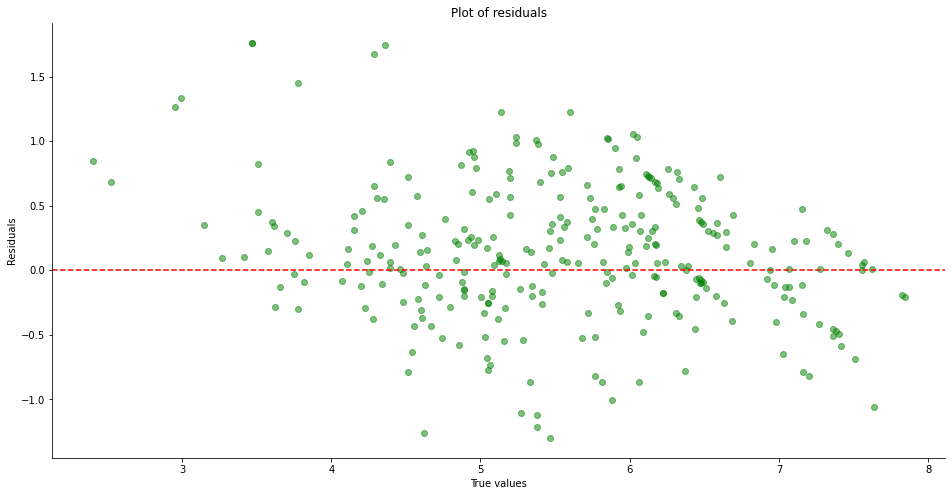

Error mean: -0.0006713282423767257


In [514]:
errors_tree = y_predict_test_tree - y_test
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors_tree, color='g', alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors.mean()}')

**Residue histogram for the decision tree**

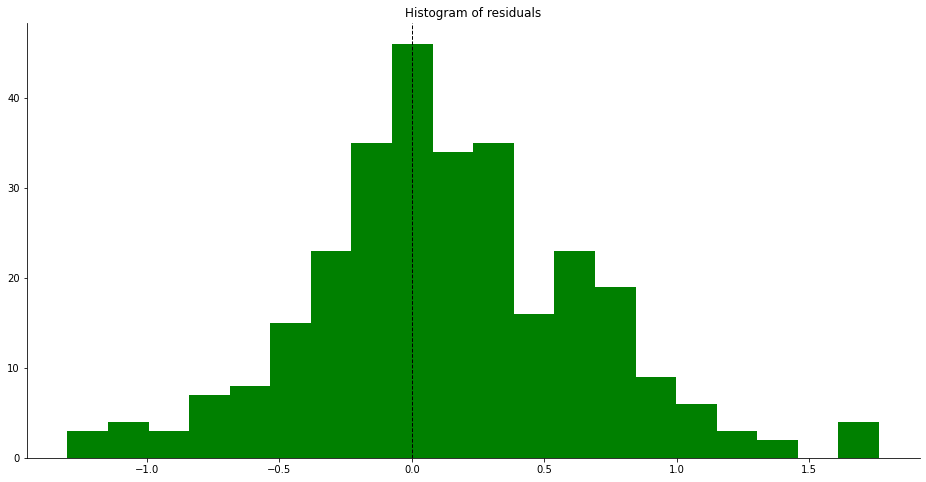

In [515]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors_tree, color='g', bins=20)
plt.axvline(errors.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

The above graph clearly shows that the decision tree model is much more wrong than the linear regression model.
For linear regression the error is very small. 

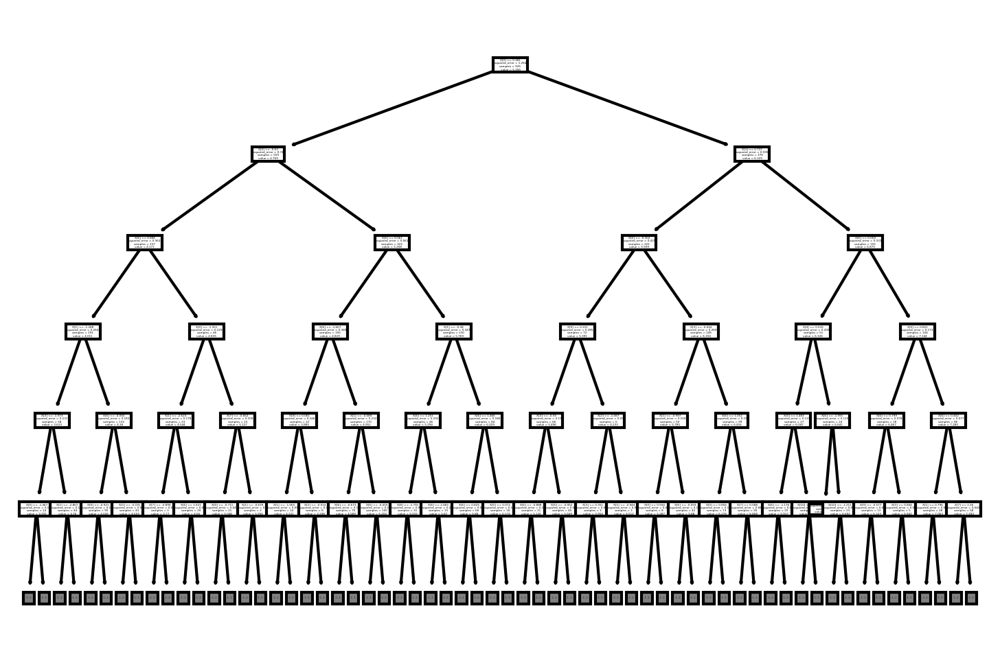

In [516]:
from sklearn.tree import plot_tree
plt.figure(dpi=300)      
plot_tree(model_tree, max_depth=5)
plt.show()

### Coefficient of determination

In [517]:
print(f'Dummy Train R^2: {r2_score(y_train, y_train_dummy)}') 
print(f'RL Model Train R^2: {r2_score(y_train, y_predict_train)}')

Dummy Train R^2: 0.0
RL Model Train R^2: 0.999996625100716


R^2 shows us how much better our model explains variability than the mean, hence R^2 for a model that is the mean gives 0. Since we do not know the mean of the test set, we should not calculate R^2 for it.

R-squared is a correlation metric. Correlation is measured by "r" and tells us how strongly two variables can be related to each other. A correlation closer to +1 means a strong relationship in the positive direction, while -1 means a stronger relationship in the opposite direction. A value closer to 0 means that there is not much relationship between the variables. R-squared is closely related to correlation. 

**Random Forest**

**Trenujemy model**

In [518]:
model_rf = rfr(n_estimators=35, max_depth=None, random_state = 40)
model_rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=35, random_state=40)

**Predykcja**

In [519]:
y_predict_test_rf = model_rf.predict(X_test)
y_predict_train_rf = model_rf.predict(X_train)

**Comparison of true value with prediction**

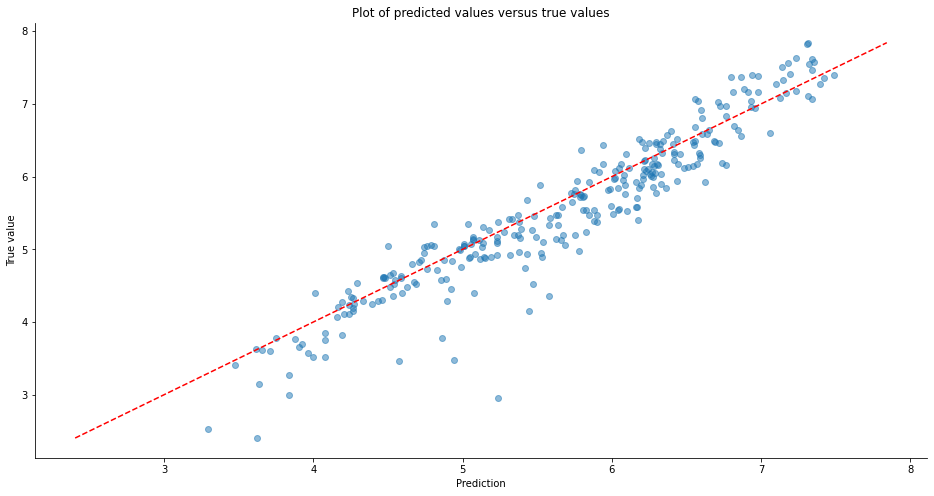

In [520]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_predict_test_rf, y = y_test, alpha=0.5)

xmin_rf, xmax_rf = y_test.min(), y_test.max()
x_line_rf = np.linspace(xmin_rf, xmax_rf, 10)   
y_line_rf = x_line_rf

# Oczekiwana linia trendu

plt.plot(x_line_rf, y_line_rf, 'r--')  

plt.xlabel('Prediction')
plt.ylabel('True value')
plt.title('Plot of predicted values versus true values')

plt.show()

The Random Forest model is far superior to the Decision Tree, but does not predict results with such accuracy like linear regression.

**Errors** 

**MAE for Random Forest**

In [521]:
MAE_model_train_rf = mean_absolute_error(y_train, y_predict_train_rf)
MAE_model_test_rf = mean_absolute_error(y_test, y_predict_test_rf)

print('Train')
print(f'MAE Dummy: {MAE_dummy_train}')
print(f'MAE RL Model_rf: {MAE_model_train_rf}')

print('\nTest:')
print(f'MAE Dummy: {MAE_dummy_test}')
print(f'MAE RL Model_rf: {MAE_model_test_rf}')

Train
MAE Dummy: 0.9348458158942521
MAE RL Model_rf: 0.06120465176832903

Test:
MAE Dummy: 0.8871266263911254
MAE RL Model_rf: 0.26360030734776546


**MAPE (%) for Random Forest**

In [522]:
MAPE_model_test_rf = mean_absolute_percentage_error(y_test, y_predict_test_rf)*100

print('Test:')
print(f'MAPE Dummy: {MAPE_dummy_test}%')
print(f'MAPE Model_rf: {MAPE_model_test_rf}%')

Test:
MAPE Dummy: 17.1152071365751%
MAPE Model_rf: 5.3395206041594685%


**MSE for Random Forest**

In [523]:
MSE_model_test_rf = mean_squared_error(y_test, y_predict_test_rf) 

print('Test')
print(f'MSE Dummy: {MSE_dummy}')
print(f'MSE Model_rf: {MSE_model_test_rf}')

Test
MSE Dummy: 1.1814226728291994
MSE Model_rf: 0.13789323971272133


**RMSE (pierwiastek z MSE) dla Random Forest**

In [524]:
RMSE_model_test_rf = sqrt(MSE_model_test_rf)

print('Test')
print(f'RMSE Dummy: {RMSE_dummy}')
print(f'RMSE Model_rf: {RMSE_model_test_rf}')

Test
RMSE Dummy: 1.0869326901097416
RMSE Model_rf: 0.37133979010162826


In [525]:
model_rf

RandomForestRegressor(n_estimators=35, random_state=40)

**Residue chart**

In [526]:
errors_rf = y_predict_test_rf - y_test

mae_rf = mean_absolute_error(y_test, y_predict_test_rf)
mape_rf = mean_absolute_percentage_error(y_test, y_predict_test_rf)*100
mse_rf = mean_squared_error(y_test, y_predict_test_rf)
rmse_rf = sqrt(mse_rf)
print('MAE:', mae_rf)
print('MAPE:', mape_rf)
print('MSE:', mse_rf)
print('RMSE:', rmse_rf)

MAE: 0.26360030734776546
MAPE: 5.3395206041594685
MSE: 0.13789323971272133
RMSE: 0.37133979010162826


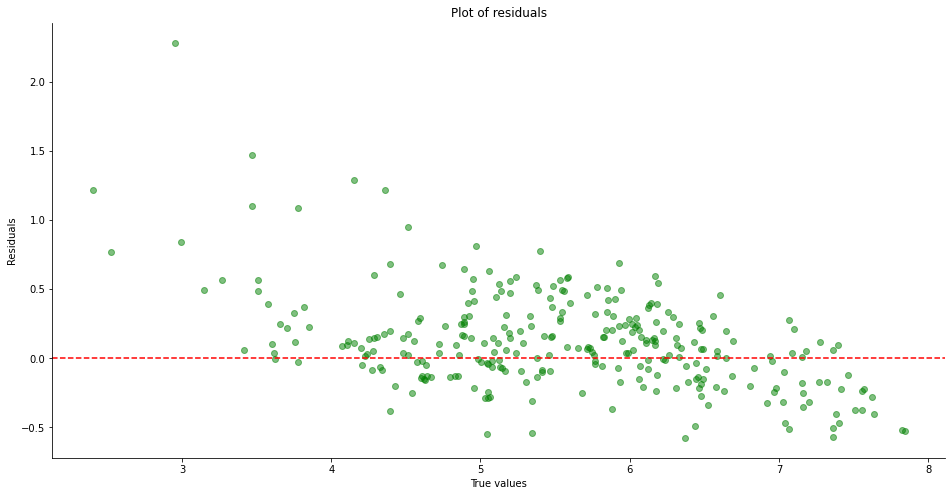

Error mean: 0.12212241731006312


In [527]:
fig = plt.figure(figsize=(16,8))
plt.scatter(x = y_test, y= errors_rf, color='g', alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('True values')
plt.ylabel('Residuals')
plt.title('Plot of residuals')
plt.show()
print(f'Error mean: {errors_rf.mean()}')

**Histogram reszt**

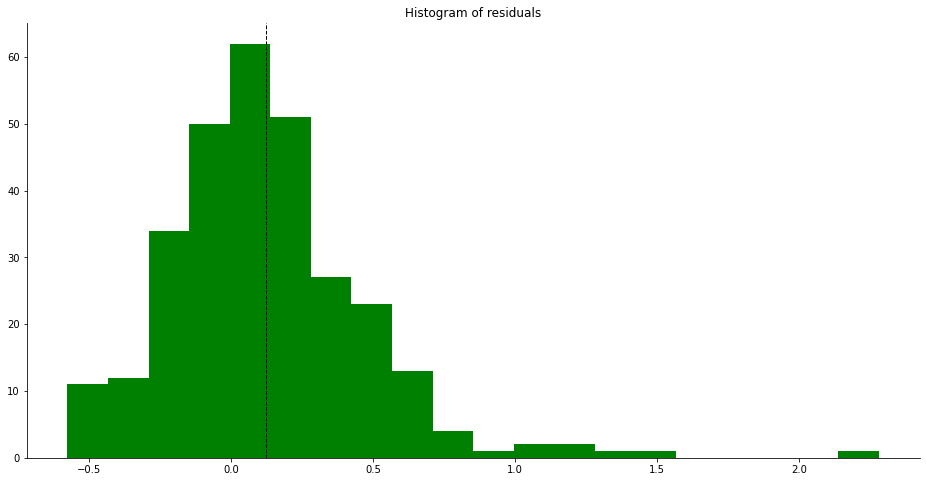

In [528]:
fig = plt.figure(figsize=(16,8))
plt.hist(errors_rf, color='g', bins=20)
plt.axvline(errors_rf.mean(), color='k', linestyle='dashed', linewidth=1)
plt.title('Histogram of residuals')
plt.show()

**Comparison - Linear Regression, Decision Tree and Random Forest**

In [529]:
data1 = {
    'Model': ['Regresja Liniowa', 'Regresja Liniowa', 'Regresja Liniowa', 'Regresja Liniowa', 
              'Drzewo decyzyjne', 'Drzewo decyzyjne', 'Drzewo decyzyjne', 'Drzewo decyzyjne',
              'Random Forest', 'Random Forest', 'Random Forest', 'Random Forest'],
    'Errors': ['MAE_rl_model_test', 'MAPE_rl_model_test', 'MSE_rl_model', 'RMSE_rl_model', 'MAE_rl_model_test_tree', 
               'MAPE_rl_model_test_tree', 'MSE_rl_model_test_tree', 'RMSE_rl_model_tree', 'MAE_model_test_rf', 
               'MAPE_model_test_rf', 'MSE_model_test_rf', 'RMSE_model_test_rf'],
    'Value': [MAE_rl_model_test, MAPE_rl_model_test, MSE_rl_model, RMSE_rl_model, MAE_rl_model_test_tree, 
               MAPE_rl_model_test_tree, MSE_rl_model_test_tree, RMSE_rl_model_tree, MAE_model_test_rf, 
               MAPE_model_test_rf, MSE_model_test_rf, RMSE_model_test_rf]}

In [530]:
df = pd.DataFrame(data1, columns=['Model', 'Errors', 'Value'])

In [531]:
df

,Model,Errors,Value
0,Regresja Liniowa,MAE_rl_model_test,0.000892
1,Regresja Liniowa,MAPE_rl_model_test,0.016696
2,Regresja Liniowa,MSE_rl_model,0.000001
3,Regresja Liniowa,RMSE_rl_model,0.001119
4,Drzewo decyzyjne,MAE_rl_model_test_tree,0.414052
5,Drzewo decyzyjne,MAPE_rl_model_test_tree,8.048918
6,Drzewo decyzyjne,MSE_rl_model_test_tree,0.295185
7,Drzewo decyzyjne,RMSE_rl_model_tree,0.543310
8,Random Forest,MAE_model_test_rf,0.263600
9,Random Forest,MAPE_model_test_rf,5.339521


**Comparison of errors of all models**

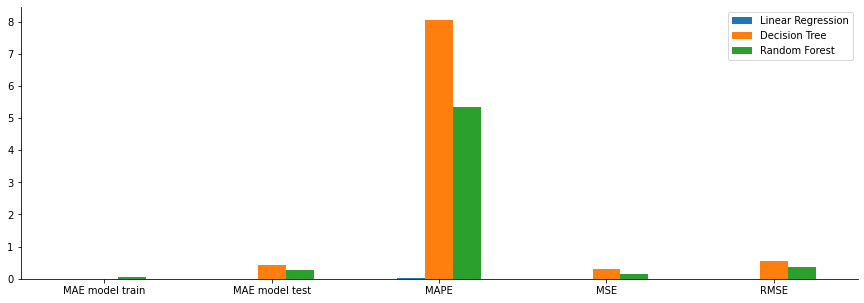

In [532]:
plt.rcParams["figure.figsize"] = (15, 5)

LinearRegression = [MAE_rl_model_train, MAE_rl_model_test, MAPE_rl_model_test, MSE_rl_model, RMSE_rl_model]

DecisionTree = [MAE_rl_model_train_tree, MAE_rl_model_test_tree, 
                MAPE_rl_model_test_tree, MSE_rl_model_test_tree, RMSE_rl_model_tree]

RandomForest = [MAE_model_train_rf, MAE_model_test_rf, MAPE_model_test_rf, MSE_model_test_rf, RMSE_model_test_rf]

index = ['MAE model train', 'MAE model test', 'MAPE', 'MSE', 'RMSE']


df = pd.DataFrame({'Linear Regression': LinearRegression, 
                   'Decision Tree': DecisionTree, 
                   'Random Forest': RandomForest}, index=index)

ax = df.plot.bar(rot=0)

The best results were definitely achieved by linear regression. 

**Value of validity of features for individual models, specifying their impact on target (Happiness). **

In [533]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': lr_model.coef_[0]
})
importances = importances.sort_values(by='Importance', ascending=False)

def background_color_change(val):
    if (isinstance(val, float)):
        if (val > 0.3):
            background = 'yellow'
        else:
            background = 'white'
        return 'background: %s' % background
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.401136
1,Social support,0.401136
2,Life Exp,0.401136
3,Freedom,0.401136
4,Generosity,0.401136
5,Gov Corruption,0.401136
6,Dystopia Residual,0.401136
7,Broadband,0.401136
8,Internet individuals,0.401136
9,Fertility,0.401136


In [534]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': model_tree.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.491557
6,Dystopia Residual,0.190990
2,Life Exp,0.128301
3,Freedom,0.093635
1,Social support,0.054424
9,Fertility,0.013903
4,Generosity,0.009524
10,Annual sunshine,0.005902
7,Broadband,0.005777
5,Gov Corruption,0.003205


In [535]:
importances = pd.DataFrame(data={
    'Attribute': X.columns,
    'Importance': model_rf.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=False)
 
importances.style.applymap(background_color_change)

,Attribute,Importance
0,GDP per capita,0.403487
2,Life Exp,0.239423
6,Dystopia Residual,0.180400
3,Freedom,0.058895
1,Social support,0.049139
5,Gov Corruption,0.022640
9,Fertility,0.019549
4,Generosity,0.010820
7,Broadband,0.009987
10,Annual sunshine,0.004158
